In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session
# limitations under the License.

In [2]:
import tensorflow as tf

In [3]:
tf.__version__

'2.4.1'

In [4]:
# To generate GIFs
!pip install imageio
!pip install git+https://github.com/tensorflow/docs

  Cloning https://github.com/tensorflow/docs to /tmp/pip-req-build-tfumgyvs
  Running command git clone -q https://github.com/tensorflow/docs /tmp/pip-req-build-tfumgyvs
  Created wheel for tensorflow-docs: filename=tensorflow_docs-0.0.0.dev0-py3-none-any.whl size=180228 sha256=abb9ccfbc7201e2202f4c547731c4830eb6a52299b73e6504e8a80c0b4f76a68
  Stored in directory: /tmp/pip-ephem-wheel-cache-_j0r5u3n/wheels/cc/c4/d8/5341e93b6376c5c929c49469fce21155eb69cef1a4da4ce32c
Successfully built tensorflow-docs


In [5]:
import os
import time
from IPython import display

import glob
import matplotlib.pyplot as plt
import numpy as np
import random as rnd

from tensorflow.keras import layers
import tensorflow_datasets as tfds

import imageio
import PIL
from PIL import Image, ImageEnhance, ImageFilter
# from scipy.misc import imsave

In [6]:
def bwimshow(img):
    plt.imshow(img, cmap='gray')
    plt.show()

def perc_compl(num, den, last_step, text=None,step=0.1):
    perc=((num+1)/den)*100
    if int(perc)==100 or perc>=(last_step+step):
        last_step+=step
        to_write=''
        if text!= None:
            to_write+=text
        to_write+=" [{:-<20.20}]".format("="*int(perc/5)+">")
        to_write+="  {:<2.2f} %  completed".format(perc)
        print('\r'+to_write,end='')
        if int(perc)==100: print(end='\n\n')
    return last_step
#needs to be called as stepping=perc_compl(i,up_to,last_step=stepping)

# Settings

In queste prime celle del programma ci sono le impostazioni di memoria, preprocessing ed architettura dei due modelli GAN. 

In particolare, per rendere il training fattibile in tempi utili ho dovuto preprocessare separatamente le immagini e caricarle inline durante il training. Nell'iterazione del programma che consegnerò, il programma non userà comunque nulla di precedentemente calcolato svolgerà tutto da zero salvando localmente le immagini preprocessate

In [7]:
#  --------------------------------------------------------------- dataset init settings
DATASET_TYPEMODE='to_fetch'

FETCH_LOOKUP='auto'
FETCH_FOLDER='../input/dc-gan-data-prep-3'
# FETCH_FOLDER='../input/dc-gan-data-prep-flowers'

FETCH='force'

if FETCH_LOOKUP=='strict' or DATASET_TYPEMODE=='new':
    # DATASET='flowers'
    # DATASET='mnist'
#     DATASET='celeba'
    IMG_FOLDER_PATH='unk'
    # IMG_FOLDER_PATH="../input/oneshotpokemon/kaggle-one-shot-pokemon/pokemon-a"
    # IMG_FOLDER_PATH="../input/oneshotpokemon/kaggle-one-shot-pokemon"
    # IMG_FOLDER_PATH="../input/celeba-dataset/img_align_celeba/img_align_celeba"
    # IMG_FOLDER_PATH='../input/100-bird-species'
    DH_mode='SL_prep'
    # DH_SL_folder='./'
    # DH_SL_folder="../input/dc-gan-data-prep-3"
    # DH_SL_folder='../input/dg-gan-data-prep-birds'
    # DH_SL_folder='../input/dg-gan-data-prep-pokemon'
    DH_SL_folder='../input/dc-gan-data-prep-flowers'
    DH_SL_format='batch'
    # ------------------------------------------------------------- pathname checker
    def CPC(pathname):
        if "512x512" in pathname:
            return False
        if "224x224" in pathname:
            return False
    #     img=Image.open(pathname)
    #     if len(img.getbands())!=4:
    #         return False

        return True
    #  --------------------------------------------------------------- dataset preprocessing settings
    #ad ogni comando, None per non fare quella parte di preprocessing
    # COLORMODE='L'
    COLORMODE='RGB'
    RESIZE_IMG_COOMMAND={'max_size':(225,300),'nearest_mult_floor':32} #<----- posso aggiungere una funzione 'infer' retroattiva
    NORMALIZE=False                   #<------ se li salvo già normalizzati pesa molto perché saranno float invece che int
    INLINE_NORMALIZE=not NORMALIZE    #<------ quindi normalizzarli inline salva memoria, ed è anche più veloce a caricarli (quindi ad iterare sul dataset)
    # INLINE_NORMALIZE=True

    BATCH_SIZE = 32
    SHUFFLE=True
    
    DH_FILESCAN='nr'
    
elif FETCH_LOOKUP=='auto' and DATASET_TYPEMODE=='to_fetch':
    DATASET=None
    IMG_FOLDER_PATH=FETCH_FOLDER
    
    BATCH_SIZE='infer'
    
    CPC=None
    DH_FILESCAN='no'
    


In [8]:
LOAD_MODELS=True
SAVE_MODELS=False

# IMG_LOAD_PATH='./'
IMG_LOAD_PATH="../input/train-results/results (3)"

# -------------------------------------------------------
GENERATOR_CUST_NAME='infer'
GENERATOR_MODE='new'

GENERATOR_LOAD_PATHNAME=None
if LOAD_MODELS:
    GENERATOR_MODE='load'
    GENERATOR_LOAD_PATHNAME='../input/train-results/results (3)/CELEBA_Generator_noisesize_250imgshape_(104 88 3)sizemodel_16_50'

GENERATOR_SAVE=True or SAVE_MODELS
GENERATOR_SAVE_NAMEMODE='cust+auto'
GENERATOR_SAVE_PATH="./"
# GENERATOR_SAVE_NAME="CELEBA_NEW_GENERATOR"    #NON LO USO IN QUESTA ISTANZA
# if 'auto' in GENERATOR_SAVE_NAMEMODE:
#     GENERATOR_SAVE_NAME=None
# if 'cust' in GENERATOR_SAVE_NAMEMODE:
#     GENERATOR_SAVE_NAME=None
    

# -------------------------------------------------------
DISCRIMINATOR_CUST_NAME='infer'
DISCRIMINATOR_MODE='new'

DISCRIMINATOR_LOAD_PATHNAME=None
if LOAD_MODELS:
    DISCRIMINATOR_MODE='load'
    DISCRIMINATOR_LOAD_PATHNAME='../input/train-results/results (3)/CELEBA__Discriminator_imgshape_(104 88 3)sizemodel_10_50'

DISCRIMINATOR_SAVE=True or SAVE_MODELS
DISCRIMINATOR_SAVE_NAMEMODE='cust+auto'
DISCRIMINATOR_SAVE_PATH="./"
# DISCRIMINATOR_SAVE_NAME="CELEBA_NEW_DISCRIMINATOR"   #NON LO USO IN QUESTA ISTANZA
# if 'auto' in DISCRIMINATOR_SAVE_NAMEMODE:
#     DISCRIMINATOR_SAVE_NAME=None
# if 'cust' in DISCRIMINATOR_SAVE_NAMEMODE:
#     DISCRIMINATOR_SAVE_NAME=None
    

In [9]:
# --------------------------------------------------------------- models architecture settings
USE_MANUAL_COMMANDS=False 
    
IMG_SHAPE='infer' #<---- la deduce da solo da quel che trova nel DH

# --------------------------------------------------------------- models quantit.settings
NOISE_SIZE = 500
DISCRIMINATOR_WEIGHT_LOSS_ON_GENERATED=1     #<----- l'architettura DC GAN prevede 1


In [10]:
TEST_RUN=False


# --------------------------------------------------------------- training settings
EPOCHS = 75

CHECKPOINT_STEPS=10

# --------------------------------------------------------------- visualization settings
num_examples_to_generate = 15
seed = tf.random.normal([num_examples_to_generate, NOISE_SIZE])





In [11]:
# SOME REF
# https://arxiv.org/pdf/1802.03446.pdf
# https://www.programmersought.com/article/22324820196/

In [12]:
GEN_ROUTINE={
    'IN_SHAPE':NOISE_SIZE,
    'OUT_SHAPE':IMG_SHAPE,
    'N_CONV_LAYERS':4,
    'FIRST_TENSOR_THICKNESS':256,
    'OUT_CHANNELS':[256],
    'STRIDES':[(1,1),(2,2),(2,2)],
    'FILTER_SHAPES':[(7,7),(5,5)],
    'PADDING':'same',
    'BATCHNORM':True,
    'ACTIVATION':'leakyrelu',
}

DIS_ROUTINE={
    'IN_SHAPE':IMG_SHAPE,
    'OUT_SHAPE':1,
    'N_CONV_LAYERS':2,
    'N_FILTERS':64,
    'STRIDES':[(2,2),(2,2)],
    'FILTER_SHAPES':[(5,5)],
    'PADDING':'same',
    'BATCHNORM':False,
    'ACTIVATION':'leakyrelu',
    'DROPOUT':0.3,
    'LAST_LAY_ACT':'sigmoid'
}

In [13]:
# ----------------------------------------------------------  generator model MANUAL settings

img_rows=int(108)
img_cols=int(88)
img_chan=1
SUB_SMP=4

first_lay_generator_rows=int(img_rows/SUB_SMP)
first_lay_generator_cols=int(img_cols/SUB_SMP)

MANUAL_GENERATOR_COMMANDS=[
    {'input':(NOISE_SIZE)},                
    {'dense': {'out_shape':first_lay_generator_rows*first_lay_generator_cols*256, 'use_bias':False} },
    {'batchnormalization'},
    {'activation': 'leakyrelu'},
    {'reshape': (int(first_lay_generator_rows),int(first_lay_generator_cols),256) },
    {'conv2dtr': {'out_channels': 128, 'filters_shape':(5, 5), 'strides':(1, 1)} },
    {'batchnormalization'},
    {'activation':'leakyrelu'},
    {'conv2dtr': {'out_channels': 64, 'filters_shape':(5, 5), 'strides':(2, 2)} },
    {'batchnormalization'},
    {'activation':'leakyrelu'},
    {'conv2dtr': {'out_channels': 1, 'filters_shape':(5, 5), 'strides':(2, 2)} },
    {'activation':'tanh'}
]

# ---------------------------------------------------------- discriminator model MANUAL settings

MANUAL_DISCRIMINATOR_COMMANDS=[
    {'input':(img_rows,img_cols,img_chan)},                
    {'conv2d': {'N_filters': 64, 'filters_shape':(5, 5), 'strides':(2, 2)} },
    {'activation':'leakyrelu'},
    {'dropout':0.3},
    {'conv2d': {'N_filters': 128, 'filters_shape':(5, 5), 'strides':(2, 2)} },
    {'activation':'leakyrelu'},
    {'dropout':0.3},
    {'reshape': 'flatten'},
    {'dense':1}
]

# Dataset manager class

Con questa classe mi sono occupato del preprocessing delle immagini, provando varie opzioni tra colori e dimensioni dell'input da dare ai modelli convoluzionali.
Automatizzare la coordinazione tra preprocessing e immagini è stato importante per per velocità di esecuzione del programma, ma anche per avere immagini coerenti (in dimensioni e colori) con quelle generate dal modello senza dover continuamente riscrivere tutto il codice


In [14]:
def def_CPC(pathname):
    return True
       
def def_custom_prep_ops(img):    #<------ va implmementato il passaggio a save and preprocess
    width, height= img.size
    if width>height:
        return img.rotate(90, expand=True)
    return img

# def_custom_prep_ops = None    


class Dataset_Holder():                                              
                                                             # mode può essere 'inline_prep', 'SL_prep', 'keep_prep'
    def __init__(self, folder_path=None, typemode='new', name=None, filescan='yes', verb=True, mode='inline_prep', custom_pathname_checker=None):  #<---- filescan può essere 'yes', 'no', 'nr' o 'nr+as'
        
        self.typemode=typemode
        
        if typemode=='new':
            if custom_pathname_checker==None:
                custom_pathname_checker=def_CPC
                
            self.folder_path=folder_path

            self.file_pathname_list=[]
            for dirname, _, filenames in os.walk(self.folder_path):
                for filename in filenames:
                    found_pathname=os.path.join(dirname, filename)
                    if not custom_pathname_checker(found_pathname):
                        continue
    #                 found_pathname=found_pathname[len(self.folder_path)+1:]
                    if found_pathname[-3:]=='jpg' or found_pathname[-3:]=='png' or found_pathname[-4:]=='jpeg':
                        self.file_pathname_list.append(found_pathname)

            self.dataset_size=len(self.file_pathname_list)
            
        elif typemode=='to_fetch':
            self.folder_path=folder_path
            self.file_pathname_list=None
            self.dataset_size='unk'
            

        self.dataset_name=name

        self.batch_size=self.dataset_size
        self.batch_pathname_list=self.file_pathname_list   #<---- inizializza con batch === tutto il dataset
        self.shuffled=False
        self.given_batch_setting=False
        
        self.prep_turn_off=False
        self.PREP_SETT={'colormode':False,  #stringa da passare a convert
               'resize':False,      #dizionario con keys passabili "mult" e/o "nearest_mulf (floor aut ceil)"
               'normalize':False    #TorF
              }
        self.inline_normalize=False
        self.given_preprocess_setting=False
        self.preprocess_compiled=False
        
        
        self.mode=mode
        
        self.SL_folder_path=None      #var/par per mode 'SL_prep'
        self.SL_prep_prefix='prep_'
        self.SL_batch_prefix=''
        self.SL_format=None
        self.prep_filename_batches=None
        self.prep_batch_names=None
            
        self.fetched=False
        
        self.held_prep=None          #var/par per mode 'keep_prep'

        print("\n  dataset in folder: ", self.folder_path)
        print("  found", self.dataset_size," files")
        print("  memory management mode:", self.mode)
        
        self.filescan=filescan
        self.scan_done=False
        self.unprep_img_sizes='unk'
        self.IMG_SAME_SIZE='unk'
        self.IMG_SAME_CHANNELS='unk'
        self.unprep_img_width ='unk'
        self.unprep_img_height='unk'
        self.unprep_img_channels='unk'
        self.unprep_img_bands=['unk']
        self.prep_img_width ='unk'
        self.prep_img_height='unk'
        self.prep_img_channels='unk'
        self.prep_img_bands=['unk']
        
        if typemode=='new':
            if filescan != 'no':
                self.scan_files(filescan)          
            print("  scanned folder:", self.scan_done, " ( scan mode is "+filescan+")")
            print("  unprocessed images height  (N rows) :",self.unprep_img_height)
            print("  unprocessed images width (N columns):",self.unprep_img_width )
            if self.scan_done or 'as' in filescan:
                print("    (pictures", end='')
                if self.IMG_SAME_SIZE:  print(" all have the same size) ")
                else: 
                    print(" have", len(self.unprep_img_sizes)," different width/height couples): ")
                    print(self.unprep_img_sizes)
            print("  unprocessed images channels(N bands):",self.unprep_img_channels," (",self.unprep_img_bands,")" )
            if self.scan_done or 'as' in filescan:
                print("    (pictures", end='')
                if self.IMG_SAME_CHANNELS:  print(" all have the same channels) ")
                else: 
                    print(" have", len(self.unprep_img_channels)," different kind of channels) ")
                    print(self.unprep_img_bands)

        self.verb=verb
                

        
    def scan_files(self, filescan=None):
        found_sizes=[]
        found_bands=[]
        # found_channels=[]
        if filescan is None:
            filescan=self.filescan
        if filescan=='yes':
            print("scanning folder... ")
        stepping=-1
        tot_images=self.dataset_size
        for n, img_pathname in enumerate(self.file_pathname_list):
            stepping=perc_compl(n,tot_images,last_step=stepping, step=0.001,
                                text="     {:>6d}".format(n+1)+" images scanned  ")   
            img=Image.open(img_pathname)
            img_size=img.size
            img_bands=img.getbands()
            if img_size not in found_sizes:
                found_sizes.append(img_size)
            if img_bands not in found_bands:
                found_bands.append(img_bands)    
            del img
            if 'nr' in filescan:
                print()
                break
                
        if 'nr' not in filescan or 'as' in filescan:
#             print(found_sizes)
#             print(found_bands)
            self.unprep_img_sizes=found_sizes
            self.unprep_img_bands=found_bands
        if ('nr' not in filescan and len(found_sizes)==1) or 'as' in filescan:
            self.IMG_SAME_SIZE=True
            self.unprep_img_width =found_sizes[0][0]
            self.unprep_img_height=found_sizes[0][1]
        else:
            self.IMG_SAME_SIZE=False
            self.unprep_img_width ='misc'
            self.unprep_img_height='misc'     #<--- non molto informativo ma tedio altrimenti
            
        if ('nr' not in filescan and len(found_bands)==1) or 'as' in filescan:
            self.IMG_SAME_CHANNELS=True
            self.unprep_img_channels=len(found_bands[0])
            self.unprep_img_bands=found_bands[0]
        else:
            self.IMG_SAME_CHANNELS=False
            self.unprep_img_channels =[len(found_band) for found_band in found_bands]
            self.unprep_img_bands=found_bands
               
        if 'nr' not in filescan:
            self.scan_done=True
            
        return found_sizes, found_bands
            
    def display_state(self, verbosity=2):
        
        print("  "+"-"*15+"===[[ DATASET HOLDER SETTINGS/STATE ]]==="+"-"*15)
        print()
        print("  "+"-"*20+"dataset info")
        print("  typemode:", self.typemode)
        print("  name:",self.dataset_name)
        print("  folder_path:",self.folder_path)
#         self.file_pathname_list
        print("  dataset_size:",self.dataset_size)
        print()   
        print("  "+"-"*20+"preprocess and sampling info")
        print("   preprocess turned on:", not self.prep_turn_off)
        if not self.prep_turn_off or verbosity>=2:
            print("   preprocess settings:",self.PREP_SETT)
        print("   inline (during iteration) normalization:", self.inline_normalize)
        if self.inline_normalize is True and self.PREP_SETT['normalize'] is True:
            print("   MAJOR WARNING   both normalization on preprocessing and iteration are set to True (this shouldn't happend)")
            return
        print("   sampling settings: batch size",self.batch_size,", shuffle",self.shuffled)
#         self.batch_pathname_list 
#         self.prep_filename_batches=None
#         self.prep_batch_names=None
        print()
        print("  "+"-"*20+"memory management info")   
        print("   memory management mode:", self.mode)
        if self.mode=='SL_prep' or verbosity>=2:
            print("   FETCH state:", self.fetched)
            print("   SL_folder_path: ",self.SL_folder_path)
            print("   SL_format: ",self.SL_format)
            print("   SL_prep_prefix: ",self.SL_prep_prefix)
            if self.SL_format=='batch' or verbosity>=2:
                print("   SL_batch_prefix: ",self.SL_batch_prefix)
        print()
        print("  "+"-"*20+"images info")           
        print("  scanned folder:", self.scan_done, " ( scan mode is "+self.filescan+")")
        print("  unprocessed images height   (N rows) :",self.unprep_img_height)
        print("  unprocessed images width  (N columns):",self.unprep_img_width )
        print("  unprocessed images channels (N bands):",self.unprep_img_channels," (",self.unprep_img_bands,")" )
        print("  unprocessed images of same size:",self.IMG_SAME_SIZE)
        print("  processed images height   (N rows) :",self.prep_img_height)
        print("  processed images width  (N columns):",self.prep_img_width )
        print("  processed images channels (N bands):",self.prep_img_channels," (",self.prep_img_bands,")" )
        if verbosity>=1:
            print()
            print("  "+"-"*20+"internal state info")           
            print("   self.given_batch_setting, state:",self.given_batch_setting)
            print("   self.given_preprocess_setting, state:",self.given_preprocess_setting)
            print("   self.preprocess_compiled, state:",self.preprocess_compiled)
            print("   self iterator verbosity:",self.verb)

           
  
#  ------------------------------------------------------------------ sampling preprocessing function
    def set_sampling(self, batch_size=None, shuffle=True):
        if shuffle:
            self.shuffled=True
            if self.typemode=='new':
                rnd.shuffle(self.file_pathname_list)    #<--- inline shuffling         
            
        if batch_size!= None:
            self.batch_size=batch_size
            if self.typemode=='new':
                self.batch_pathname_list=[]
                dss=self.dataset_size
                for n in range(0, dss, batch_size):
                    self.batch_pathname_list.append( self.file_pathname_list[n:min(n+batch_size, dss)]  )
                
        self.given_batch_setting=True
        self.set_SL_prefixes()
 
    def set_preprocess(self, colormode='nochange', resize='nochange', normalize='nochange', inline_normalize='nochange', turn_off=False):
        if not turn_off:
            if colormode != 'nochange':
                self.PREP_SETT['colormode']=colormode
            if resize != 'nochange':
                self.PREP_SETT['resize']=resize     #<---- dizionario con key "mult" e/o "max_dim" ed un valore 
            if normalize != 'nochange':
                self.PREP_SETT['normalize']=normalize
            if inline_normalize != 'nochange':
                if self.PREP_SETT['normalize'] and inline_normalize:
                    print(" WARNING normalization will occour in data preprocessing, cannot normalize inline") 
                    print("  (set normalize=False to allow inline_normalize=True)")
                else:
                    self.inline_normalize=inline_normalize
            self.given_preprocess_setting=True
            self.preprocess_compiled=False
            self.set_SL_prefixes()
        else:
            self.prep_turn_off=True
            
            
 #  ------------------------------------------------------------------ prefix-name functions           
    def set_prep_prefix(self, custom=None, pre_prefix=''):
        self.SL_prep_prefix=pre_prefix
        if self.prep_turn_off:
            self.SL_prep_prefix+="noprep_"
            return
        
        self.SL_prep_prefix+="prep_[_"
        for comm, par in self.PREP_SETT.items():
            if par is None or par==False:
                continue
            self.SL_prep_prefix+=comm[:3]+":"
            if isinstance(par,dict):
                self.SL_prep_prefix+='{_'
                for parcomm, parpar in par.items():
                    if parcomm=='mult': 
                        self.SL_prep_prefix+='mlt'
                    elif 'nearest_mult' in parcomm:  
                        self.SL_prep_prefix+='nm'
                        if 'floor' in parcomm: self.SL_prep_prefix+='f'
                        elif 'ceil' in parcomm: self.SL_prep_prefix+='c'
                    else:
                        self.SL_prep_prefix+=parcomm
                    self.SL_prep_prefix+=':'+str(parpar)+'_'
                self.SL_prep_prefix+='}_'
            else:
                self.SL_prep_prefix+=str(par)+"_"
        self.SL_prep_prefix+="]_"   
        
    def set_prep_batch_prefix(self, custom=None):
        if self.dataset_name==None:
            ds_name=''
        self.SL_batch_prefix=ds_name+"_"
        self.SL_batch_prefix+=self.SL_prep_prefix
        if self.shuffled: shf="Tr"
        else: shf="Fl"
        self.SL_batch_prefix+="[_shf:"+shf+"_"
        self.SL_batch_prefix+="Bsize:"+str(self.batch_size)+"_]_"
        
    def set_SL_prefixes(self, custom_prep=None, custom_btc=None):
#         print("inside set sl prefix")
        if self.SL_format=='img' or self.SL_format=='nparrimg':
#             print("inside if img condition")
            if self.dataset_name==None:
                ds_name=''
            self.set_prep_prefix(pre_prefix=ds_name+'_')
        else:
            self.set_prep_prefix()
        self.set_prep_batch_prefix()
            
# ------------------------------------------------------------------ loading and preprocessing an image

    def load_and_preprocess(self, image_pathname, just_load=False, preprocess_is_active=True, out_type='nparr', custom_ops=def_custom_prep_ops):
#         img_path=os.path.join(self.folder_path, image_name) DEPRECATED
        img=Image.open(image_pathname)
        if just_load:
            return img
        if not preprocess_is_active or self.prep_turn_off:
            if out_type=='nparr':
                return np.array(img)
            else:
                return img
            
        if custom_ops!=None:
            img=custom_ops(img)

        if not self.preprocess_compiled:
            if self.PREP_SETT['colormode'] != None:
                colormode=self.PREP_SETT['colormode']
                if type(colormode) is not str:
                    print("ERROR: colormode must be string")
                else:
                    img=img.convert(colormode)
            self.prep_img_bands=img.getbands()
            self.prep_img_channels=len(self.prep_img_bands)
            width, height= img.size       #         ip posso anche impostare il preprocessing per broadcast alla stessa size  
            if self.PREP_SETT['resize'] != None:
   
                if 'max_size' in list(self.PREP_SETT['resize'].keys()):
#                     img.thumbnail( self.PREP_SETT['resize']['max_size'] ) #sostituisce inline
                    width= self.PREP_SETT['resize']['max_size'][0]
                    height=self.PREP_SETT['resize']['max_size'][1]
                
                if 'mult' in list(self.PREP_SETT['resize'].keys()):
                    mult_val=self.PREP_SETT['resize']['mult']
                    height= height* mult_val
                    width = width * mult_val 

                if 'nearest_mult_floor' in list(self.PREP_SETT['resize'].keys()):
                    mult_val=self.PREP_SETT['resize']['nearest_mult_floor']
                    height=np.floor(height/mult_val)*mult_val
                    width =np.floor(width /mult_val)*mult_val
                elif 'nearest_mult_ceil' in list(self.PREP_SETT['resize'].keys()):
                    mult_val=self.PREP_SETT['resize']['nearest_mult_ceil']
                    height= np.ceil(height/mult_val)*mult_val
                    width = np.ceil(width /mult_val)*mult_val
                    
                if 'fixed_size' in list(self.PREP_SETT['resize'].keys()):
                    width= self.PREP_SETT['resize']['fixed_size'][0]
                    height=self.PREP_SETT['resize']['fixed_size'][1]
                    

            self.prep_img_width =int(width)
            self.prep_img_height=int(height)   
            self.preprocess_compiled=True
            # deve fare broadcast alla stessa size, channels
            # quindi questo serve solo per fargli trovare le dimensioni di broadcast alla prima iterazione
            # poche righe qui sotto c'è un assert per controllare che sia così per ogni immagine
        elif self.PREP_SETT['colormode'] != None:
            colormode=self.PREP_SETT['colormode']
            img=img.convert(colormode)
        if self.PREP_SETT['resize'] != None:
            img=img.resize( (self.prep_img_width, self.prep_img_height) )
#             print("did a resize")

        try:
            assert img.getbands()==self.prep_img_bands
        except ValueError:
            print("self...", self.prep_img_bands)

        try:
            assert (self.prep_img_width, self.prep_img_height)== img.size
        except ValueError:
            print("self...", self.prep_img_width, self.prep_img_height )
            print("img....", img.size)
            raise
        
        if out_type == 'img':
            return img
        
        img=np.array(img)
        if self.PREP_SETT['normalize']:
            img=(img-127.5)/127.5
            
        return img   
            
            
#  ------------------------------------------------------------------ memory management functions
    def set_memory_mode(self, mode=None, folder=None, SL_format=None):
        if mode!= None:
            self.mode=mode                            #può essere 'img', 'nparrimg' o 'batch'
        if self.mode =='SL_prep':
            if folder is None:
                if self.SL_folder_path is None:
                    print("ERROR mode", self.mode," requires a folder to save and load data")
                    return
            else:
                self.SL_folder_path=folder
            if SL_format!= None:
                self.SL_format=SL_format
        self.set_SL_prefixes()
            
        
    def preprocess_and_save(self, allow_override=False):  #assumes deve essere chiamata solo DOPO aver settato preprocessing e batching
#         print("inside preprocess and save")
        if self.typemode != 'new':
            print("   MAJOR WARNING this DH typemode is ", self.typemode)
            return
        
        if self.fetched and not allow_override:
            print("WARNING Dataset Holder already fetched to", self.SL_folder_path)
            return    
        if self.mode=='inline_prep':
            print("WARNING mode is set to", self.mode)
            return
        if not self.given_batch_setting:
            print("WARNING in mode "+self.mode+" this function MUST be called after setting batches and preprocessing")
            return
        if not self.given_preprocess_setting:
            print("WARNING in mode "+self.mode+" this function MUST be called after setting batches and preprocessing")
            return

        N_batches=len(self.batch_pathname_list)

        stepping=-1
        
        if self.mode=='keep_prep':
            if self.held_prep!=None and not allow_override:
                print("WARNING memory already allocated ")
                return
            
            self.held_prep=[]    # non ha ancora in memoria interna i dati ma li terrà dopo la run dell'interatore
            for x, batch in enumerate(self.batch_pathname_list):
                processed_batch=[]
                for img_name in batch:
                    processed_img=self.load_and_preprocess(img_name)
                    processed_batch.append(processed_img)
                if self.verb:
                    stepping=perc_compl(x,N_batches,last_step=stepping, step=0.001,
                    text="     {:>6d}".format(x+1)+" batches elaborated (first run of iterator) ")

                batch_array_to_return= np.array(processed_batch).reshape(len(batch) , 
                                                        self.prep_img_height, 
                                                        self.prep_img_width, 
                                                        self.prep_img_channels) 
                tf_tensor_batch=tf.convert_to_tensor(batch_array_to_return)
                self.held_prep.append(tf_tensor_batch)
                           
        if self.mode=='SL_prep':
            if self.prep_filename_batches!=None and not allow_override:  
                print("ERROR memory already allocated ")
                return
#             print("inside mode", self.mode," of preprocess_and_save")    
            self.prep_filename_batches=[]
            self.prep_batch_names=[]
            processed_batch=['vedo se funziona come dovrebbe ed esco a pranzare giuro']
            for x, batch in enumerate(self.batch_pathname_list):
                del processed_batch
                processed_batch=[]
                batch_prep_filenames=[]
                for h, img_name in enumerate(batch):
                    processed_img=self.load_and_preprocess(img_name)
                    prep_img_name=self.SL_prep_prefix+"_B{:05d};F{:05d}_".format(x+1,h+1)+'.npy'
                    batch_prep_filenames.append(prep_img_name)
                    
                    if self.SL_format=='batch':
                        processed_batch.append(processed_img)
                    if self.SL_format=='nparrimg':
                        prep_img_pathname=os.path.join(self.SL_folder_path, prep_img_name)
                        np.save(prep_img_pathname, processed_img)
                    if self.SL_format=='img':   #non testata
                        img=self.load_and_preprocess(img_name, normalize=False, out_type='img')
                        prep_img_pathname=os.path.join(self.SL_folder_path, prep_img_name)
                        img.save(prep_img_pathname)  
                        
                self.prep_filename_batches.append(batch_prep_filenames)
                
                if self.SL_format=='batch':
                    batch_name=self.SL_batch_prefix+"batch{:05d}".format(x+1)+".npy"
                    self.prep_batch_names.append(batch_name)
                    batch_pathname=os.path.join(self.SL_folder_path, batch_name)
                    batch_array= np.array(processed_batch).reshape(len(batch),
                                                                   self.prep_img_height,
                                                                   self.prep_img_width, 
                                                                   self.prep_img_channels
                                                                  ) 
                    np.save(batch_pathname,batch_array)
          
                if self.verb:
                    stepping=perc_compl(x,N_batches,last_step=stepping, step=0.001,
                    text="     {:>6d}".format(x+1)+" batches elaborated (first run of iterator) ")
                    
            self.fetched=True
 
    def fetch(self, folder=None, SL_format=None, lookup='strict', allow_override=False):
        if self.fetched and not allow_override:
            print("ERROR Dataset Holder already fetched to folder", self.SL_folder_path)
            return

        if lookup=='strict':
            if not self.given_batch_setting:
                print("ERROR fetching can be requested only after setting batches and preprocessing")
                return
            if not self.given_preprocess_setting:
                print("ERROR fetching can be requested only after setting batches and preprocessing")
                return
            if self.mode!= 'SL_prep':
                print("WARNING switching mode from", self.mode," to SL_prep")
                self.mode='SL_prep'
            if SL_format==None:
                if self.SL_format==None:
                    print("ERROR needs to define an input format")
                    return
                else:
                    self.SL_format=SL_format
                    
        elif lookup=='auto':
            self.set_preprocess(colormode='unk', 
                  resize='unk', 
                  normalize='unk', 
                  inline_normalize='unk')
            self.inline_normalize=True   #<-------- TEMPORANEO ma uso sempre questa modalità
            self.set_sampling(batch_size='unk', shuffle='unk')
            self.mode='SL_prep'
            if folder==None:
                if self.SL_folder_path==None:
                    if self.folder_path==None:
                        print("    ERROR no folder provided ")
                        return
                    else:
                        folder='curr'
                        
        else:
            print("    ERROR unknown lookup mode:", lookup)
            
        if folder==None:
            if self.SL_folder_path==None:
                print("ERROR required a folder to fetch (set folder='curr' for fetching current folder)")
                return
        elif folder=='curr':
            self.SL_folder_path=self.folder_path
        else:
            self.SL_folder_path=folder
            
        print("    Lookup mode:", lookup)
        print("    SL_folder_path is:", self.SL_folder_path)  
        #fetcha quel che trova nella folder:
        found_files=os.listdir(self.SL_folder_path)
        print(" folder ", self.SL_folder_path,"containing total of", len(found_files),"files")
        autofound_nparrimg=[name for name in found_files if 'jpg' in name and '.npy' in name]
        autofound_batches =[name for name in found_files if 'batch' in name and '.npy' in name]
        print("         images:", len(autofound_nparrimg),"; batches:", len(autofound_batches))
        
        if lookup=='auto':
            if len(autofound_batches)==0:
                if len(autofound_nparrimg)==0:
                    print("   ERROR no batches or imgs found with auto-lookup")
                else:
                    self.SL_format='nparrimg'
            else:
                self.SL_format='batch'
                
#         if self.SL_format=='img':
#             print("not implemented")
#             return
#         if self.SL_format=='nparrimg':
#             if lookup=='strict':
#                 found_nparrimg=[name for name in found_files if self.SL_prep_prefix in name and 'jpg.npy' in name ]
#             n_found=len(found_nparrimg)
#             self.prep_filename_batches=[]
#             for n in range(0, n_found, self.batch_size):
#                 self.prep_filename_batches.append(found_nparrimg[n: min((n+1)*self.batch_size, n_found)])
                
#             print(" folder ", self.SL_folder_path,"containing total of", len(found_files),"files")
#             print(" with lookup mode:", lookup)
#             if lookup=='strict':
#                 print(" searching images preprocessed as ", self.SL_prep_prefix)
#             print(" managed to fetch total of", n_found,"images")
#             print(" then divided into", len(self.prep_filename_batches),"batches")
                
        n_found=0    
        if self.SL_format=='batch':
            if lookup=='strict':
                print(" searching images preprocessed as ", self.SL_batch_prefix)
                self.prep_batch_names=[name for name in found_files if self.SL_batch_prefix in name and 'batch' in name ]
            elif lookup=='auto':
                self.prep_batch_names=autofound_batches
                
            n_found=len(self.prep_batch_names)
            print(" managed to fetch total of", n_found,"batches")
        
        if(n_found>0):
            if lookup=='auto':
                # getting dataset name
                if self.dataset_name==None:
                    sn=self.prep_batch_names[0]
                    self.dataset_name=sn[:sn.find('_')]
                if self.SL_format=='batch':
                    self.SL_batch_prefix=sn[:sn.find('batch')]
                    self.SL_prep_prefix=sn[sn.find('prep'):sn.find('batch')]
                #getting other preprocess info?
            
            if self.SL_format=='batch':
                sample_batch=np.load( os.path.join(self.SL_folder_path, self.prep_batch_names[0]) )
#                 print(sample_batch.shape)
                self.batch_size=len(sample_batch)
                self.prep_img_height=sample_batch[0].shape[0]
                self.prep_img_width=sample_batch[0].shape[1]
                self.prep_img_channels=sample_batch[0].shape[2]
                
                self.dataset_size=self.batch_size*(len(self.prep_batch_names)-1)+len(  np.load( os.path.join(self.SL_folder_path, self.prep_batch_names[-1]) )  )
            self.fetched=True
        else:
            print("\n\n   WARNING fetch failed <-----------------------------")
                
    
# ------------------------------------------------------------------ img get-show function
 
    
    def show_img(self, n=1, prep=True, rndm=True, get=False, cmap='def', correct_renorm=False, show=True):
        imgs_to_display=[]
        
        if 'to_fetch' in self.typemode:
            if not rndm and prep:
                counter=0
                for batch in self:
                    for img in batch:
                        counter+=1
                        if counter>n: break
                        img=(img.numpy()*127.5+127.5).astype(int)    
                        imgs_to_display.append(img)
                    if counter>n: break
            else:
                print("   this DH instance typemode is:", self.typemode,"... unknown original images")
                        
        if 'new' in self.typemode:
            if rndm:
                img_names_sample=rnd.sample( self.file_pathname_list, n )
            else:
                img_names_sample=self.file_pathname_list[:n]

            for i, img_name in enumerate(img_names_sample):
                img=self.load_and_preprocess( img_name, preprocess_is_active=prep )
                imgs_to_display.append(img)
        
        fig = plt.figure(figsize=(25, 5))
        for i, img in enumerate(imgs_to_display):        
            this_cmap=cmap
            if cmap=='def':
                if len(img.shape)==2:
                    this_cmap='gray'
                else:
                    this_cmap=None
            if correct_renorm:
                img=(img*127.5 + 127.5).astype(int)
            if n==5:
                plt.subplot(1, 5, i+1)
            plt.imshow(img, cmap=this_cmap)
            if n!=5 and show:
                plt.show()
                
        if n==5 and show:
            plt.show()
        if n==1 and get==True:
            return img
            
    def show_first_img(self, n=5, prep=True, cmap='def', correct_renorm=False):
        self.show_img(n=n, prep=prep, rndm=False, cmap=cmap, correct_renorm=correct_renorm)
        
    def get_prep_shapes(self, verbose=1):
        if verbose >=2:
            print("  unprocessed images height  (N rows) :",self.unprep_img_height)
            print("  unprocessed images width (N columns):",self.unprep_img_width )
            print("  unprocessed images channels (colors):",self.unprep_img_width )
            print()
        if verbose >=1:
            print("  processed images height  (N rows) :",self.prep_img_height)
            print("  processed images width (N columns):",self.prep_img_width )
            print("  processed images channels (colors):",self.prep_img_channels )
        return ( self.prep_img_height, self.prep_img_width, self.prep_img_channels )
    
    def compute_avg_img(self, sample_size='auto', correct_renorm='auto'):
        if sample_size=='auto':
            sample_size=self.dataset_size
        if correct_renorm=='auto':
            if self.PREP_SETT['normalize'] or self.inline_normalize:
                correct_renorm=True
#                 renorm_curr=False
            else:
                correct_renorm=False
#                 renorm_curr=True
                
                
        avg_img=np.zeros( (self.prep_img_height, self.prep_img_width, self.prep_img_channels) )   
        counter=0
        for img_batch in self:
            if counter> sample_size: break
            for img in img_batch:      #l'iterazione le restituisce normalizzate (a meno di setting che sarebbe scorretto utilizzare per GAN TRAIN)
                counter+=1
                if counter> sample_size: break
                if counter%1000==0:
                    print("   ",counter," imgs added", end='')
                avg_img+=img
                
        avg_img/=sample_size       
        if correct_renorm: avg_img=np.array(avg_img*127.5+127.5).astype(int)
            
        print("\n\n")
        print("   avg img in sample of",sample_size)
        plt.imshow(avg_img)
        plt.axis('off')
        plt.show()
        return avg_img                      
            
        
        
# ------------------------------------------------------------------------ iterator
    
    def __iter__(self):
        
        N_batches=len(self.prep_batch_names)
        stepping=-1

        if self.mode=='inline_prep':
            processed_batch=['qui rischio di stare tutto il giorno ad aspettare il training']
            for x, batch in enumerate(self.batch_pathname_list):           
                del processed_batch
                processed_batch=[]
                for img_name in batch:
                    processed_img=self.load_and_preprocess(img_name)
                    if self.inline_normalize:
                        processed_img=(processed_img-127.5)/127.5
                    processed_batch.append(processed_img)
                if self.verb:
                    stepping=perc_compl(x,N_batches,last_step=stepping, step=0.001,
                    text="     {:>6d}".format(x+1)+" batches elaborated  ")
                    
                batch_array_to_return= np.array(processed_batch).reshape(len(batch), 
                                                        self.prep_img_height, 
                                                        self.prep_img_width, 
                                                        self.prep_img_channels) 
                tf_tensor_batch=tf.convert_to_tensor(batch_array_to_return)
                yield tf_tensor_batch
                
# -------------------------------------------------------------------- iterator instructions for mode 'keep_prep'

        elif self.mode=='keep_prep': 
            for x, tf_tensor_batch in enumerate(self.held_prep):
                if self.verb:
                    stepping=perc_compl(x,N_batches,last_step=stepping, step=0.001,
                    text="     {:>6d}".format(x+1)+" batches passed  ")
                if self.inline_normalize:
                    tf_tensor_batch=(tf_tensor_batch-127.5)/127.5  #non testato, perché quello è un tf.tensor 
                yield tf_tensor_batch
                    
# -------------------------------------------------------------------- iterator instructions for mode 'SL_prep' 

        elif self.mode=='SL_prep': #   vvvvvv----- iterator instructions for first run of mode 'keep_prep'   
            processed_batch=['credo che tutto questo lo avrei potuto scrivere meglio se avessi pranzato']
            batch_array_to_return=['uhm']
            
#             if self.SL_format=='img':
#                 print("not implemented and possibly not needed")
#                 return
            
#             if self.SL_format=='nparrimg':
#                 for x, batch_prep_filenames in enumerate(self.prep_filename_batches):
#                     del batch_array_to_return
#                     del processed_batch
#                     processed_batch=[]
#                     for prep_img_name in batch_prep_filenames:
#                         prep_img_pathname=os.path.join(self.SL_folder_path, prep_img_name)
#                         prep_img=np.load(prep_img_pathname)
#                         if self.inline_normalize:
#                             prep_img=(prep_img-127.5)/127.5
#                         processed_batch.append(prep_img)

#                     batch_array_to_return= np.array(processed_batch).reshape(len(batch_prep_filenames),  
#                                                             self.prep_img_height, 
#                                                             self.prep_img_width, 
#                                                             self.prep_img_channels)
#                     tf_tensor_batch=tf.convert_to_tensor(batch_array_to_return)
#                     if self.verb:
#                         stepping=perc_compl(x,N_batches,last_step=stepping, step=0.001,
#                         text="     {:>6d}".format(x+1)+" preprocessed batches loaded ")
#                     yield tf_tensor_batch
                    
            if self.SL_format=='batch':
                for x, batch_name in enumerate(self.prep_batch_names):
                    del processed_batch
                    batch_pathname=os.path.join(self.SL_folder_path, batch_name)
                    processed_batch=np.load(batch_pathname)  #<---VVV---i batch sono salvati come array, 
                    if self.inline_normalize:
                        processed_batch=(processed_batch-127.5)/127.5
                    tf_tensor_batch=tf.convert_to_tensor(processed_batch) # ma mi risparmierei questa riga se salvassi come tf.tensors
                    if self.verb:
                        stepping=perc_compl(x,N_batches,last_step=stepping, step=0.001,
                        text="     {:>6d}".format(x+1)+" preprocessed batches loaded ")
                    yield tf_tensor_batch                  
                    
             
        else:
            print("ERROR no match for call", self.mode," in dataset iterator")
            
                
   

# Routine di indicazioni su come costruire i modelli

Queste funzioni non aggiungono nessuna funzione al programma ma ne migliorano la maneggevolezza, e mi hanno quindi facilitato i diversi test con variazioni di architetture.

Ad esempio, è importante che i lati delle immagini siano multipli di 2 elevato al numero di volte che si esegue un conv2d-trasposto con stride di (2,2), che quindi il preprocessing dia immagini di queste dimensioni e che il primo layer del generatore abbia quella dimensione diviso 2 elevato a quel valore. Queste routine automatizzano questo ed altri processi per risparmiare a me di dover scrivere e controllare ad ogni diversa iterazione che sia così

In [15]:
DEF_DENSE_PARAMS={
    'out_shape':1,
    'use_bias':True
}
    
DEF_CONV2D_PARAMS={
    'N_filters':25,
    'filters_shape':(5,5),
    'strides':(1,1),
    'padding':'same',
    'use_bias':True
}

DEF_CONV2DTR_PARAMS={
    'out_channels':25,
    'filters_shape':(5,5),
    'strides':(1,1),
    'padding':'same',
    'use_bias':False
}

from copy import deepcopy

def add_layer_subroutine(sequentialmodel, layertype, parameters=None, verbose=0):  #, activation=None, dropout=None, reshape=None):
#                                                               ^^^^^ implementazione basica senza chiamata "compatta"

#     nonlocal sequentialmodel   #<--- inline adding (NB pare che non si possa...)
#                         NB ^^^^^ NON SO COSA MODIFICHI INLINE O LOCAL quindi nel dubbio lo returno alla fine
#                         NB ^^^^^ ma con sequentialmodel.add modifica inline, quindi lì non serve returnare
    pars=None
    
    if layertype == 'input':     #sequentialmodel deve essere già inizializzato come sequential
        pars=parameters         #parameters dev'essere una tupla della forma in input, oppure None 
#         sequentialmodel=tf.keras.Sequential([ tf.keras.Input(shape=shape) ])  #inizializza il sequentialmodel
        sequentialmodel.add( tf.keras.Input(shape=pars))
    
    if layertype == 'dense':
        pars=deepcopy(DEF_DENSE_PARAMS)
#         kernel_reg=None
#         kernel_init=None  non implementate, per ora non servono
        if type(parameters) is int:    #se passato solo un valore int quello sarà solo out_shape
            out_shape=parameters
        else:                      #altrimenti parameters dev'essere un dizionario {nome_feat: valore}
            for par_name in parameters:
                if par_name not in pars:
                    print("WARNING ", par_name," not a keyword for instance of", layertype)
                pars[par_name]=parameters[par_name]
            

        sequentialmodel.add( tf.keras.layers.Dense(pars['out_shape'], 
                                                   use_bias=pars['use_bias']) 
                           )
            
    if layertype == 'conv2d':
        pars=deepcopy(DEF_CONV2D_PARAMS)
        
        for par_name in parameters:
            if par_name not in pars:
                print("WARNING ", par_name," not a keyword for instance of", layertype)
            pars[par_name]=parameters[par_name]
            
        sequentialmodel.add( tf.keras.layers.Conv2D(pars['N_filters'], 
                                                    pars['filters_shape'], 
                                                    strides=pars['strides'], 
                                                    padding=pars['padding'],
                                                    use_bias=pars['use_bias'])
                           )
        
    if layertype == 'conv2dtr':
        pars=deepcopy(DEF_CONV2DTR_PARAMS)
        
        for par_name in parameters:
            if par_name not in pars:
                print("WARNING ", par_name," not a keyword for instance of", layertype)
            pars[par_name]=parameters[par_name]

        sequentialmodel.add( tf.keras.layers.Conv2DTranspose(pars['out_channels'],
                                                             pars['filters_shape'],
                                                             strides=pars['strides'],
                                                             padding=pars['padding'],
                                                             use_bias=pars['use_bias'])
                           )
    if layertype == 'activation':
        # parameters dev'essere una stringa con il nome del tipo di attivazione
        # possibili: 'relu', 'sigmoid', 'tanh', 'softmax',...
        # non implementata parametrizzazione dell'attivazione
        pars=parameters
        try:
            sequentialmodel.add( tf.keras.layers.Activation(parameters))
        except:
            if parameters == 'leakyrelu':
                sequentialmodel.add( tf.keras.layers.LeakyReLU())
            else:
                print("parameter ",parameters," is unknown activation function")
                
        
    if layertype == 'reshape':
        pars=parameters
        if parameters == 'flatten':                    #parameters deve essere 'flatten' o la tupla di reshaping
            sequentialmodel.add( tf.keras.layers.Flatten())
        else:
            shape_tuple=parameters
            sequentialmodel.add( tf.keras.layers.Reshape(shape_tuple) ) 
    
    if layertype == 'batchnormalization':
        pars=parameters
        sequentialmodel.add( tf.keras.layers.BatchNormalization() )
        
    if layertype == 'dropout':
        pars=parameters                          #parameters dev'essere un valore tra 0 e 1
        sequentialmodel.add( tf.keras.layers.Dropout(pars))
        
    if verbose>=3:
        print("     addedd laytype:", layertype,"; parameters:", pars)



In [16]:
def build_sequential_routine(command_list, verbose=3):  #0 dice nulla, 1 il summary, 2 ogni layer + summary
    print(" building sequential model...\n")
    model=tf.keras.Sequential()

    for command in command_list:
        for laytype in command:
#             print(type(command))
            if isinstance(command, dict):
#                 print("I'm here")
                params=command[laytype]
            else:
                params=None
                
        if verbose>=2 :
            if laytype == 'dense' or laytype=='conv2d' or laytype=='conv2dtr':
                print("-"*55)
            if verbose>=4:
                print(" adding layer", laytype,", commands:", params)
        add_layer_subroutine(model, laytype, params, verbose=verbose)

    if verbose >=1:
        print()
        print()
        model.summary()
    return model
        

In [17]:
def get_block_commands(blocktype, block_params, batchnormalization=False, activation=False, reshape=False, dropout=False):
    commands=[]
    commands.append( { blocktype : block_params} )
    if batchnormalization:
        commands.append( {'batchnormalization'} )
    if activation:
        commands.append( {'activation': activation} )
    if reshape:
        commands.append( {'reshape': reshape} )
    if dropout:
        commands.append( {'dropout': dropout} )
    
    return commands

In [18]:
def get_std_generator_commands(in_shape, out_shape, N_conv_layers='infer', first_tensor_thickness=256,
                               out_channels=None, strides=[(1,1),(2,2),(2,2)], filter_shapes=[(5,5)], padding='same', 
                               batchnorm=True, activation='leakyrelu', 
                               modeltype='custom', verb_warning='strict'):
    
    commands=[]
    assert type(in_shape) is int or type(in_shape) is tuple
    if type(in_shape) is int:
        in_shape=(in_shape)
    commands+=get_block_commands('input', in_shape) 
    assert type(out_shape) is tuple and len(out_shape)==3
    assert first_tensor_thickness is None or type(first_tensor_thickness) is int
    
    if out_channels is None:
        if first_tensor_thickness is None:
            print("ERROR out_channel OR first_tensor_thickness must be provided")
            return
        out_channels=int(first_tensor_thickness/2)
        if verb_warning=='strict':
            print("WARNING first channels size inferred by first_tensor_thickness/2=",out_channels )
    if type(out_channels) is not list:
        if type(out_channels) is int:
            out_channels=[out_channels]  
        else:
            print("ERROR provided type ", type(out_channels)," out_channels")
            return
    if type(strides) is not list:
        if type(strides) is tuple:
            strides=[strides]  
        else:
            print("ERROR provided type ", type(strides)," strides")
            return
    if type(filter_shapes) is not list:
        if type(filter_shapes) is tuple:
            filter_shapes=[filter_shapes]  
        else:
            print("ERROR provided type ", type(filter_shapes)," filter_shapes")
            return
        
    # CHECK MOLTO IMPORTANTE PER AVERE UNA DELLE INTENDED BEHAVIOUR
    assert (
        N_conv_layers=='infer'
        or (  type(N_conv_layers) is int and N_conv_layers>= max( len(strides),len(filter_shapes),len(out_channels) )  )
    )
    assert(type(out_channels) is list)
    assert(type(strides) is list)
    assert(type(filter_shapes) is list)
    
    if  N_conv_layers=='infer':
        N_conv_layers=max( len(strides), len(filter_shapes), len(out_channels) )
        
    if len(strides)< N_conv_layers: 
        if verb_warning=='strict':
            print("WARNING provided list of strides of lenght", len(strides)," while expected N_conv_layers is", N_conv_layers)
            print("        filling latest layers with latest value provided:", strides[-1])
        for _ in range(N_conv_layers-len(strides)):
            strides.append(strides[-1])
    if len(filter_shapes)< N_conv_layers:
        if verb_warning=='strict':
            print("WARNING provided list of filter_shapes of lenght", len(filter_shapes)," while expected N_conv_layers is", N_conv_layers)
            print("        filling latest layers with latest value provided:", filter_shapes[-1])
        for _ in range(N_conv_layers-len(filter_shapes)):
            filter_shapes.append(filter_shapes[-1])
    if len(out_channels)< N_conv_layers:
        if verb_warning=='strict':
            print("WARNING provided list of out_channels of lenght", len(out_channels)," while expected N_conv_layers is", N_conv_layers)
            print("        filling latest layers with recursive half of:", out_channels[-1])
        for _ in range(N_conv_layers-len(out_channels)):
            out_channels.append(out_channels[-1]/2) 
    out_channels[-1]=out_shape[2]
            
    assert len(strides) == len(filter_shapes)
    assert len(strides) == len(out_channels)

# first layer: dense with infered shape from strides and number of layers
    height_multiplyer=1
    width_multiplyer=1
    for stride in strides:
        height_multiplyer*=stride[0]
        width_multiplyer*=stride[1]    
    first_shape=(int(out_shape[0]/height_multiplyer), int(out_shape[1]/width_multiplyer), first_tensor_thickness)
    commands+=get_block_commands(
        'dense', 
        {'out_shape': first_shape[0]*first_shape[1]*first_shape[2], 'use_bias':False},
        batchnormalization=batchnorm,
        activation=activation,
        reshape=first_shape
    )
#N_conv_layers iterations of conv2dtranspose:
    for out_chan, stride, filter_shape, n_lay in zip(out_channels, strides, filter_shapes, range(N_conv_layers)):
        if n_lay==N_conv_layers-1:
            print(n_lay,"-"*20)
            batchnorm=False
            activation='tanh'
        commands+=get_block_commands(
            'conv2dtr',
            {'out_channels':out_chan, 'strides':stride, 'filters_shape':filter_shape, 'padding':padding},
            batchnormalization=batchnorm,
            activation=activation,
        )
    
    return commands
    
        

In [19]:

def get_std_discriminator_commands(in_shape, out_shape=1, N_conv_layers='infer',# first_tensor_thickness=256,
                                   N_filters=64, strides=[(2,2),(2,2)], filter_shapes=[(5,5)], padding='same', 
                                   batchnorm=False, last_lay_activation=False,
                                   activation='leakyrelu', dropout_value=0.3,
                                   modeltype='custom', verb_warning='strict'):
    
    commands=[]
    assert type(in_shape) is list or type(in_shape) is tuple
    if type(in_shape) is list:
        in_shape=tuple(in_shape)
    commands+=get_block_commands('input', in_shape) 
    assert type(out_shape) is int
    assert type(N_filters) is int or type(N_filters) is list or type(N_filters) is tuple 
    
    if type(N_filters) is not list and type(N_filters) is not tuple:
        if type(N_filters) is int:
            N_filters=[N_filters]  
        else:
            print("ERROR provided type ", type(N_filters)," N_filters")
            return
    if type(strides) is not list:
        if type(strides) is tuple:
            strides=[strides]  
        else:
            print("ERROR provided type ", type(strides)," strides")
            return
    if type(filter_shapes) is not list:
        if type(filter_shapes) is tuple:
            filter_shapes=[filter_shapes]  
        else:
            print("ERROR provided type ", type(filter_shapes)," filter_shapes")
            return
        
    # CHECK MOLTO IMPORTANTE PER AVERE UNA DELLE INTENDED BEHAVIOUR
    assert (
        N_conv_layers=='infer'
        or (  type(N_conv_layers) is int and N_conv_layers>= max( len(strides),len(filter_shapes),len(N_filters) )  )
    )
    assert(type(N_filters) is list)
    assert(type(strides) is list)
    assert(type(filter_shapes) is list)
    
    if  N_conv_layers=='infer':
        N_conv_layers=max( len(strides), len(filter_shapes), len(N_filters) )
        
    if len(strides)< N_conv_layers: 
        if verb_warning=='strict':
            print("WARNING provided list of strides of lenght", len(strides)," while expected N_conv_layers is", N_conv_layers)
            print("        filling latest layers with latest value provided:", strides[-1])
        for _ in range(N_conv_layers-len(strides)):
            strides.append(strides[-1])
    if len(filter_shapes)< N_conv_layers:
        if verb_warning=='strict':
            print("WARNING provided list of filter_shapes of lenght", len(filter_shapes)," while expected N_conv_layers is", N_conv_layers)
            print("        filling latest layers with latest value provided:", filter_shapes[-1])
        for _ in range(N_conv_layers-len(filter_shapes)):
            filter_shapes.append(filter_shapes[-1])
    if len(N_filters)< N_conv_layers:
        if verb_warning=='strict':
            print("WARNING provided list of N_filters of lenght", len(N_filters)," while expected N_conv_layers is", N_conv_layers)
            print("        filling latest layers with recursive duble of:", N_filters[-1])
        for _ in range(N_conv_layers-len(N_filters)):
            N_filters.append(N_filters[-1]*2) 
            
    assert len(strides) == len(filter_shapes)
    assert len(strides) == len(N_filters)


    for lay_filters, stride, filter_shape, n_lay in zip(N_filters, strides, filter_shapes, range(N_conv_layers)):

        commands+=get_block_commands(
            'conv2d',
            {'N_filters':lay_filters, 'strides':stride, 'filters_shape':filter_shape, 'padding':padding},
            batchnormalization=batchnorm,
            activation=activation,
            dropout=dropout_value
        )
    
    commands+=[{'reshape':'flatten'}]
    commands+=get_block_commands('dense',{'out_shape':out_shape}, activation=last_lay_activation)
    
    return commands

# Classi Generatore e Discriminatore

Queste classi contengono al loro interno i modelli stessi GAN, ma li contornano di funzioni utili per la visualizzazione e la valutazione dei risultati. Oltre a questo salvano e caricano in maniera da render compatibili tra loro diverse iterazioni del programma, ovverosia i modelli stessi, il loro stato interno ed i risultati.

Più interessanti sono le funzioni del generatore in termini di visualizzazione, avendo possibilità di generare facilmente "immagini che il discriminatore trova credibili", osservare i vari canali di un'immagine, esplorare lo spazio latente individuato dal generatore ed interpolare tra due volti diversi passando per questo spazio



In [20]:
USE_LOGITS=True
if DIS_ROUTINE['LAST_LAY_ACT']=='sigmoid':
    USE_LOGITS=False
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=USE_LOGITS)
    

In [21]:


class Generator(tf.Module):
    
    def __init__(self, mode, cust_name=None, commands=None, noise_size=None, img_shape=None, pathname=None, opt='def'):
        super(Generator, self).__init__()
        if mode=='new':
            self.cust_name=cust_name
            self.noise_size=noise_size
            self.img_shape=img_shape
            self.generator_commands=commands
            self.make_generator_model(commands, noise_size=noise_size, img_shape=img_shape)
            self.epochs_trained=0
            assert self.model.output_shape == (None, img_shape[0], img_shape[1], img_shape[2]) 
            
        elif mode=='load':
            self.load(pathname=pathname)
            assert self.model.output_shape == (None, img_shape[0], img_shape[1], img_shape[2]) 
        if opt=='def':
            self.optimizer = tf.keras.optimizers.Adam(1e-4)
            
        self.N_img_generated=0
        self.S_path="./"     #da implementare passaggio a inizializzatore
        self.idx_code="{:04}".format(np.random.randint(9999))
        self.collection={}
        

    def make_generator_model(self, generator_commands, noise_size, img_shape):
        self.model=build_sequential_routine(generator_commands)
                      
    def loss(self, discr_prediction):
        return cross_entropy(tf.ones_like(discr_prediction), discr_prediction)
    
    def step_epochs(self, n=1):
        self.epochs_trained+=n

    def make_out(self, noise_seed=None, N_out=1, verb=True, correct_norm=True, channels=None, cmap='def', show_original=False, save=True):
        if noise_seed!= None:
            try:
                len(noise_seed[0])
            except:
                noise_seed=[noise_seed]
            N_out=len(noise_seed)
            
        generated_images=[]
        for i in range(N_out):
            if noise_seed is None:
                noise = tf.random.normal([1, self.noise_size])
            elif N_out>1:
                noise=noise_seed[i]
                
#             print(noise.shape)
            generated_image=self.model(noise, training=False).numpy()[0]
            if correct_norm:
                generated_image=((generated_image*127.5)+127.5).astype(int) 
            generated_images.append(generated_image)
            if verb:
                if generated_image.shape[2]==1:
                    sh_channels=None
                    cmap='gray'
                else:
                    sh_channels=[]
                    if show_original or channels=='all':
                        sh_channels.append('original')
                    if type(channels) is int:
                        sh_channels.append(channels)
                        cmap='gray'
                    if channels=='all':
                        sh_channels+=list(range(generated_image.shape[2])) 
                        
                    if type(channels) is tuple:
                        channels=list(channels)
                    if type(channels) is list:
                        sh_channels+=channels

                    if cmap=='def':
                        cmap='gray'
                        
                assert(sh_channels is None or type(sh_channels) is list)
                
                if channels==None:
                    plt.imshow(generated_image, cmap=cmap)
                    if save: plt.savefig( self.S_pathname() )
                    plt.show()
                else:
                    N_chan=len(sh_channels)
                    fig= plt.figure(figsize=(5*N_chan, 5))
                    for k, chan in enumerate(sh_channels):
                        if chan=='original':
                            plt.subplot(1, N_chan, k+1)
                            plt.title("original image; shape"+str(generated_image.shape) )
                            plt.imshow(generated_image, cmap='gray')
                            
                        else:
                            plt.subplot(1, N_chan, k+1)
                            plt.title(" channel "+str(chan))
                            plt.imshow(generated_image[:,:,chan], cmap='gray')
                    if save: plt.savefig( self.S_pathname() )
                    plt.show()
                
                    
                        
        return np.array(generated_images)
    
            
    def generate_over_likelihood(self, discriminator, trashold=0.5, n_max_try=1000, verbose=1, save=True):
        found=False
        for n in range(n_max_try):
            seed=tf.random.normal([1,self.noise_size]).numpy() #to be tested: NON SO SE FUNZIONA CON ARRAY DI TIPI TENSORI E/O ARRAY DI TIPO NUMPY
            img=self.model(seed, training=False).numpy()
            prediction=discriminator.predict(img, renorm=False).numpy()[0,0]
            if prediction>trashold:
                found=True
                break
        if not found:
            print("   no image with prediction over", trashold,"found in a sample of",n_max_try)
            return
        img=(img[0]*127.5+127+5).astype(int)
        if verbose>=2:
            print("    after", n+1,"iteration, generated img with prediction of", prediction)
        if verbose>=1:
            plt.imshow(img)
            plt.axis('off')
            plt.title("  likelihood: "+str(prediction) )
            if save: plt.savefig( self.S_pathname() )
            plt.show()
      
        return seed, img, prediction
#         print("to be tested")

    def GOL(self, discriminator, trs=0.8, verb=1):
        return self.generate_over_likelihood(discriminator, trashold=trs, verbose=verb, save=True)
        
    def most_likely_on_set(self, discriminator, imgs_set=None, seeds_set=None, size_set=500, verbose=2, save=True): #, N_out='sorted') potrei farne un sort con più output
        assert imgs_set is None or seeds_set is None
        if seeds_set is not None:
            try: seeds_set.shape
            except: seeds_set=seeds_set.numpy()
        if imgs_set is not None:
            try: imgs_set.shape
            except: imgs_set=imgs_set.numpy()
    
        if imgs_set is None:
            if seeds_set is None:
                seeds_set=tf.random.normal([size_set,self.noise_size]).numpy()
            else:
                size_set=seeds_set.shape[0]
            imgs_set=self.model(seeds_set, training=False).numpy()
        else:
            size_set=imgs_set.shape[0]
            
        max_value=0
        most_likely_img=None
        for n, img in enumerate(imgs_set):
            if n%100==0:
                print("\r", n," images generated", end='')
            prediction=discriminator.predict(img).numpy()[0,0]
            if prediction>max_value:
                max_value=prediction
                most_likely_img=img
                if seeds_set is not None:
                    most_likely_seed=seeds_set[n]
                else:
                    most_likely_seed='WARN_UNDEF'
                    
        most_likely_img=(most_likely_img*127.5+127.5).astype(int)
        print("\n\n")
        print("   most likely image in sample of", len(imgs_set))
        plt.imshow(most_likely_img)
        plt.axis('off')
        plt.title("  likelihood: "+str(max_value) )
        if save: plt.savefig( self.S_pathname() )
        plt.show()
            
        return most_likely_seed, most_likely_img, max_value
            
    
    def explore_near_seed(self, seed=None, steps=14, near_factor=10, correct_norm=True, out_type='imgs', save=True):
        if seed is None:
            seed = tf.random.normal([1,self.noise_size])
        img=self.model(seed, training=False).numpy()[0]
        if correct_norm: img=(img*127.5+127.5).astype(int)
        imgs=[img]
        walk_seed=deepcopy(seed)    
        for step in range(steps):  
            step_seed=tf.random.normal([1,self.noise_size]).numpy()/near_factor
            walk_seed+=step_seed
            walk_img=self.model(walk_seed, training=False).numpy()[0]
            if correct_norm: walk_img=(walk_img*127.5+127.5).astype(int)
            imgs.append(walk_img)
            
        if out_type=='gif':
            print("to be implemented")
            out_type='imgs'
        if out_type=='imgs':
            width_plot=25
            height_plot=np.ceil( 5* np.ceil((steps+1)/5) ).astype(int)
            fig = plt.figure(figsize=(width_plot, height_plot))
            for i, img in enumerate(imgs):
                plt.subplot(np.ceil(height_plot/5).astype(int), 5, i+1)
                plt.imshow(img, cmap='gray')
                plt.axis('off')
            if save: plt.savefig( self.S_pathname() )
            plt.show()

                
   
    def interpolate_between_seeds(self, seed1=None, seed2=None, steps=13, correct_renorm=True, out_type='imgs', save=True):
        if seed1 is None:
            seed1=tf.random.normal([1,self.noise_size]).numpy() #to be tested: NON SO SE FUNZIONA CON ARRAY DI TIPI TENSORI E/O ARRAY DI TIPO NUMPY
        if seed2 is None:
            seed2=tf.random.normal([1,self.noise_size]).numpy()
            
        assert len(seed1.shape)==2 and seed1.shape[0]==1
        assert len(seed2.shape)==2 and seed2.shape[0]==1
            
        seed_succession=deepcopy(seed1)
        vec_step_diff=(seed2-seed1)/(steps+1)
        for i in range(steps):
            step_seed=seed_succession[-1]+vec_step_diff
            seed_succession=np.vstack( (seed_succession,step_seed) )
        seed_succession=np.vstack( (seed_succession,seed2) )
        
        assert len(seed_succession.shape)==2 and seed_succession.shape[0]==steps+2
        
        img_succession=[]
        for seed in seed_succession:
            shaped_seed=np.array([seed])
            this_img=self.model(shaped_seed, training=False).numpy()[0]
            if correct_renorm:
                this_img=np.array(this_img*127.5+127.5).astype(int)
            img_succession.append(this_img)
        
        if out_type=='gif':
            print("to be implemented")
            out_type='imgs'
        if out_type=='imgs':
            width_plot=25
            height_plot=np.ceil( 5* np.ceil((steps+2)/5) ).astype(int)
            fig = plt.figure(figsize=(width_plot, height_plot))
            for i, img in enumerate(img_succession):
                plt.subplot(np.ceil(height_plot/5).astype(int), 5, i+1)
                plt.imshow(img, cmap='gray')
                plt.axis('off')
            if save: plt.savefig( self.S_pathname() )
            plt.show()
            
    def compute_avg_img(self, sample_size=1000, correct_renorm=True, save=True): #NB implementato veloce NON IMPLEMENTATO PER PREVENIRE OVERFLOW O UNDERFLOW
        avg_face=np.zeros(self.img_shape)
        for i in range(sample_size):
            if i%100==0:
                print("\r    ", i, "imgs generated",end='')
            seed=tf.random.normal([1,self.noise_size])
            img=self.model(seed, training=False).numpy()[0]  #genera img normalizzata
            avg_face+=img
        avg_face=avg_face/sample_size
        if correct_renorm: avg_face=(avg_face*127.5+127.5).astype(int)
        print("\n\n ")
        print("   avg img in sample of",sample_size)
        plt.imshow(avg_face)
        plt.axis('off')
        if save: plt.savefig( self.S_pathname() )
        plt.show()
        return avg_face
        
            
# ----------------------------------------------------------------------------            
    
    def S_pathname(self):
        self.N_img_generated+=1
        
        name=self.cust_name
        name+='_'
        name+=self.idx_code
        name+='_'
        name+=str(self.N_img_generated)
        pathname=os.path.join( self.S_path, name+'.png' )
        print("(saving is/as", pathname,")")
        return pathname
        

    def make_state_dict(self):
        state_dict={}
        state_dict['cust_name']=self.cust_name
        state_dict['noise_size']=self.noise_size
        state_dict['img_shape']=self.img_shape
        state_dict['epochs_trained']=self.epochs_trained
        state_dict['generator_commands']=self.generator_commands
        return state_dict
    
    def take_state_dict(self, state_dict): #nb ci dev'essere un modo più intelligente per prendere una stringa come nome di variabile
        self.cust_name=state_dict['cust_name']
        self.noise_size=state_dict['noise_size']
        self.img_shape=state_dict['img_shape']
        self.epochs_trained=state_dict['epochs_trained']
        self.generator_commands=state_dict['generator_commands']
           
    def summary(self, verbose=2):
        print("\n\n")
        print("#"*20+" GENERATOR STATE INFO "+"#"*20)
        print("\n")
        if verbose>=2:
            state_dict=self.make_state_dict()
            for par in state_dict:
                if 'command' not in par or verbose>=3:
                    print("   ",par,":", state_dict[par])
        print()
        print()
        if verbose>=1:
            self.model.summary()
  
# -------------------------------------------------------------------- saving-loading functions

    def make_SL_pathname(self, name_mode=None, path=None, name=None, pathname=None, format=None):
        this_name=''
        if name_mode != None:
            if 'cust' in name_mode:
                this_name+=self.cust_name
            if 'auto' in name_mode:
                if len(this_name)>0: this_name+='_'
                this_name+='Generator_'
                this_name+=str(  "{noisesize:"+str(self.noise_size)+";imgshape:"+str(self.img_shape)+";sizemodel:"+str(len(self.generator_commands))+"}"  )
                this_name+=str('_'+str(self.epochs_trained))
                    
        if name != None:  #name overrides custom and/or auto
            this_name=name
        if pathname is None: 
            assert(path != None)
            this_pathname=os.path.join(path, this_name)
        
        if pathname != None: #pathname overrides path and name
            this_pathname=pathname
            
        if format != None:
            this_pathname+=str("."+format)
            
        return this_pathname


    def save_model(self, name_mode=None, path=None, name=None, pathname=None, model_format='h5'):
        pathname=self.make_SL_pathname(name_mode=name_mode, path=path, name=name, pathname=pathname, format=model_format)
        self.model.save(pathname)
        print("<---- saved model as  \t",pathname)
        
    def load_model(self, name_mode=None, path=None, name=None, pathname=None, model_format='h5'):
        pathname=self.make_SL_pathname(name_mode=name_mode, path=path, name=name, pathname=pathname, format=model_format)
        print("----> loading model from  \t",pathname)
        self.model=tf.keras.models.load_model(pathname)
        
    def save_state_info(self, name_mode=None, path=None, name=None, pathname=None, info_format='npy'):
        state_info_pathname=self.make_SL_pathname(name_mode=name_mode, path=path, name=name, pathname=pathname, format=info_format)
        state_info=self.make_state_dict()
        np.save(state_info_pathname, state_info)
        print( "<---- saved state as\t", state_info_pathname)
        
    def load_state_info(self, name_mode=None, path=None, name=None, pathname=None, info_format='npy'):
        state_info_pathname=self.make_SL_pathname(name_mode=name_mode, path=path, name=name, pathname=pathname, format=info_format)
        print("----> loading state from  \t",state_info_pathname)
        state_dict=np.load(state_info_pathname, allow_pickle=True).item()
        self.take_state_dict(state_dict)


    def save(self, name_mode=None, path=None, name=None, pathname=None, format='def', model_format='h5', info_format='npy'):
        self.save_model(name_mode=name_mode, path=path, name=name, pathname=pathname, model_format=model_format)
        self.save_state_info(name_mode=name_mode, path=path, name=name, pathname=pathname, info_format=info_format)
        
        
    def load(self, name_mode=None, path=None, name=None, pathname=None, format='def', model_format='h5',  info_format='npy'):
        self.load_model(name_mode=name_mode, path=path, name=name, pathname=pathname, model_format=model_format)
        self.load_state_info(name_mode=name_mode, path=path, name=name, pathname=pathname, info_format=info_format)
        
# -------------------------------------------------------------------- collection functions

    def make_collection(self, N_out=50, show=True, n_col=5, replace_collection=False):

    #     collection=Self.make_out(N_out=N_out, verb=False)
    #     print(collection.shape)
        if len(self.collection)==0:
            print(" Generating new collection")
        elif replace_collection:
            print(" Recplacing current collection")
            self.collection={}
        else:
            print(" Collection already present (need replace_collection=True for replacing)")
            return

        for i in range(N_out):
            noise = tf.random.normal([1, self.noise_size])
            generated_image=self.model(noise, training=False).numpy()[0]
            generated_image=((generated_image*127.5)+127.5).astype(int)
            img_id=i+1
            img_name='AVA_'+str(i+1)
            self.collection[img_id]= [img_name, generated_image]

        self.show_collection()

    def show_collection(self, n_col=5):

        n_row=int(np.ceil(len(self.collection)/n_col))
        plt.figure(figsize=(25,n_row*6))
        for n, img_id in enumerate(self.collection):

            name=self.collection[img_id][0]
            img =self.collection[img_id][1]
            plt.subplot(n_row, n_col, n+1)
            plt.axis('off')
            plt.title(name, size=25)
            plt.imshow(img)


    def replace_collection_item(self, img_id):

        old_ava_img=self.collection[img_id][1]

        noise = tf.random.normal([1, self.noise_size])
        new_ava_img=self.model(noise, training=False).numpy()[0]
        new_ava_img=((new_ava_img*127.5)+127.5).astype(int)

        self.collection[img_id][1]=new_ava_img

        plt.figure(figsize=(14,6))

        plt.subplot(1, 2, 1)
        plt.axis('off')
        plt.title("deleted "+self.collection[img_id][0])
        plt.imshow(old_ava_img)

        plt.subplot(1, 2, 2)
        plt.axis('off')
        plt.title("new "+self.collection[img_id][0])
        plt.imshow(new_ava_img)

   
    
    
        
        

In [22]:

class Discriminator(tf.Module):
    
    def __init__(self, mode, cust_name=None, commands=None, input_shape=None, weight_loss_on_generated=None, pathname=None, opt='def'):
        super(Discriminator, self).__init__()
        if mode=='new':
            self.cust_name=cust_name
            self.input_shape=input_shape
            self.weight_loss_on_generated=weight_loss_on_generated
            self.discriminator_commands=commands
            self.make_discriminator_model(input_shape, commands)
            self.epochs_trained=0
#             assert self.model.output_shape == (None, img_shape[0], img_shape[1], img_shape[2]) 
            
        elif mode=='load':
            self.load(pathname=pathname)
#             assert self.model.output_shape == (None, img_shape[0], img_shape[1], img_shape[2]) 
            
        self.optimizer = tf.keras.optimizers.Adam(1e-4)
        
        
    def make_discriminator_model(self, input_shape, discriminator_commands):
        self.model=build_sequential_routine(discriminator_commands)
        
    def predict(self, img, verb=False, renorm='auto'):   #<---- renorm
        try: img.shape
        except: print("WARNING this function requires an np.array")
        if len(img.shape)==3:
            img=np.array([img])
        assert len(img.shape)==4
        if renorm=='auto':
            if img.max()<=1:
                renorm=False
            else:
                renorm=True
        if renorm:
            img=(img-127.5)/127.5
            
        prediction=self.model(img)
        if verb and img.shape[0]==1:
            print(" discriminator prediction:", prediction)
            plt.imshow((img[0]*127.5+127.5).astype(int))
            plt.show()
            
        return prediction
            
    def loss_on_real(self, pred_on_real):
        loss_on_real = cross_entropy(tf.ones_like(pred_on_real), pred_on_real)
        return loss_on_real
    def loss_on_gen(self, pred_on_gen):
        loss_on_gen = cross_entropy(tf.zeros_like(pred_on_gen), pred_on_gen)
        return loss_on_gen
        
            
    def loss(self, pred_on_real, pred_on_gen):
        loss_on_real = self.loss_on_real(pred_on_real)
        loss_on_gen = self.loss_on_gen(pred_on_gen)
        loss_total = loss_on_real + self.weight_loss_on_generated*loss_on_gen
        return loss_total
    
    def step_epochs(self, n=1):
        self.epochs_trained+=n
    
    def make_state_dict(self):
        state_dict={}
        state_dict['cust_name']=self.cust_name
        state_dict['input_shape']=self.input_shape
        state_dict['weight_loss_on_generated']=self.weight_loss_on_generated
        state_dict['epochs_trained']=self.epochs_trained
        state_dict['discriminator_commands']=self.discriminator_commands
        return state_dict
    
    def take_state_dict(self, state_dict): #nb ci dev'essere un modo più intelligente per prendere una stringa come nome di variabile
        self.cust_name=state_dict['cust_name']
        self.input_shape=state_dict['input_shape']
        self.weight_loss_on_generated=state_dict['weight_loss_on_generated']
        self.epochs_trained=state_dict['epochs_trained']
        self.discriminator_commands=state_dict['discriminator_commands']
    
    def summary(self, verbose=2):
        print("\n\n")
        print("#"*20+" DISCRIMINATOR STATE INFO "+"#"*20)
        print("\n")
        if verbose>=2:
            state_dict=self.make_state_dict()
            for par in state_dict:
                if 'command' not in par or verbose>=3:
                    print("   ",par,":", state_dict[par])
        print()
        print()
        if verbose>=1:
            self.model.summary()
  
# -------------------------------------------------------------------- saving-loading functions

    def make_SL_pathname(self, name_mode=None, path=None, name=None, pathname=None, format=None):
        this_name=''
        if name_mode != None:
            if 'cust' in name_mode:
                this_name+=self.cust_name
            if 'auto' in name_mode:
                if len(this_name)>0: this_name+='_'
                this_name+='Discriminator_'
                this_name+=str('{imgshape:'+str(self.input_shape)+";sizemodel:"+str(len(self.discriminator_commands))+"}")
                this_name+=str('_'+str(self.epochs_trained))       
        if name != None:  #name overrides custom and/or auto
            this_name=name
        if pathname is None: 
            assert(path != None)
            this_pathname=os.path.join(path, this_name)
        
        if pathname != None: #pathname overrides path and name
            this_pathname=pathname
            
        if format != None:
            this_pathname+=str("."+format)
            
        return this_pathname

    def save_model(self, name_mode=None, path=None, name=None, pathname=None, model_format='h5'):
        pathname=self.make_SL_pathname(name_mode=name_mode, path=path, name=name, pathname=pathname, format=model_format)
        self.model.save(pathname)
        print("<---- saved model as  \t",pathname)
        
    def load_model(self, name_mode=None, path=None, name=None, pathname=None, model_format='h5'):
        pathname=self.make_SL_pathname(name_mode=name_mode, path=path, name=name, pathname=pathname, format=model_format)
        print("----> loading model from  \t",pathname)
        self.model=tf.keras.models.load_model(pathname)
        
    def save_state_info(self, name_mode=None, path=None, name=None, pathname=None, info_format='npy'):
        state_info_pathname=self.make_SL_pathname(name_mode=name_mode, path=path, name=name, pathname=pathname, format=info_format)
        state_info=self.make_state_dict()
        np.save(state_info_pathname, state_info)
        print( "<---- saved state as\t", state_info_pathname)
        
    def load_state_info(self, name_mode=None, path=None, name=None, pathname=None, info_format='npy'):
        state_info_pathname=self.make_SL_pathname(name_mode=name_mode, path=path, name=name, pathname=pathname, format=info_format)
        print("----> loading state from  \t",state_info_pathname)
        state_dict=np.load(state_info_pathname, allow_pickle=True).item()
        self.take_state_dict(state_dict)
  


    def save(self, name_mode=None, path=None, name=None, pathname=None, format='def', model_format='h5', info_format='npy'):
        self.save_model(name_mode=name_mode, path=path, name=name, pathname=pathname, model_format=model_format)
        self.save_state_info(name_mode=name_mode, path=path, name=name, pathname=pathname, info_format=info_format)
        
        
    def load(self, name_mode=None, path=None, name=None, pathname=None, format='def', model_format='h5',  info_format='npy'):
        self.load_model(name_mode=name_mode, path=path, name=name, pathname=pathname, model_format=model_format)
        self.load_state_info(name_mode=name_mode, path=path, name=name, pathname=pathname, info_format=info_format)
        
        

(End of functions definitions)

# Preparazione del dataset

Qui il dataset viene preprocessato e salvato localmente, caricato o memorizzato a seconda delle impostazioni date. Viene quindi inizializzato con le impostazioni di preprocessing delle immagini e la dimensione del batch da usare nella discesa stocastica del gradiente

In [23]:
# ----------------------------------------------------------------- DATASET init and settings
#     DH=Dataset_Holder(IMG_FOLDER_PATH, filescan='yes')
DH=Dataset_Holder(typemode=DATASET_TYPEMODE, folder_path=IMG_FOLDER_PATH, name=DATASET, filescan=DH_FILESCAN,  custom_pathname_checker=CPC)
# DH=Dataset_Holder(IMG_FOLDER_PATH, name=DATASET, filescan='yes')

if FETCH_LOOKUP == 'strict':
    DH.set_preprocess(colormode=COLORMODE, 
                      resize=RESIZE_IMG_COOMMAND, 
                      normalize=NORMALIZE, 
                      inline_normalize=INLINE_NORMALIZE)
    DH.set_sampling(batch_size=BATCH_SIZE, shuffle=SHUFFLE)
    DH.set_memory_mode(DH_mode, folder=DH_SL_folder, SL_format=DH_SL_format)


  dataset in folder:  ../input/dc-gan-data-prep-3
  found unk  files
  memory management mode: inline_prep


In [24]:
DH.display_state()
train_dataset=DH

  ---------------===[[ DATASET HOLDER SETTINGS/STATE ]]===---------------

  --------------------dataset info
  typemode: to_fetch
  name: None
  folder_path: ../input/dc-gan-data-prep-3
  dataset_size: unk

  --------------------preprocess and sampling info
   preprocess turned on: True
   preprocess settings: {'colormode': False, 'resize': False, 'normalize': False}
   inline (during iteration) normalization: False
   sampling settings: batch size unk , shuffle False

  --------------------memory management info
   memory management mode: inline_prep
   FETCH state: False
   SL_folder_path:  None
   SL_format:  None
   SL_prep_prefix:  prep_
   SL_batch_prefix:  

  --------------------images info
  scanned folder: False  ( scan mode is no)
  unprocessed images height   (N rows) : unk
  unprocessed images width  (N columns): unk
  unprocessed images channels (N bands): unk  ( ['unk'] )
  unprocessed images of same size: unk
  processed images height   (N rows) : unk
  processed image

In [25]:
DH.SL_batch_prefix

''

In [26]:
if isinstance(train_dataset, Dataset_Holder) and FETCH!='nofetch':
    try:
        train_dataset.fetch(lookup=FETCH_LOOKUP, folder=FETCH_FOLDER)
    except:
        if FETCH=='force':
            print(" fetchmode asked:", FETCH,": interrupting run")
            raise Exception(" major error occurred")
        train_dataset.set_memory_mode(folder="./")
    finally:
        if not train_dataset.fetched:
            print(" WARNING:::   FETCH FAILED")
            if FETCH=='force':
                print(" fetchmode asked:", FETCH,": interrupting run")
                raise Exception(" major error occurred") 
            if FETCH=='try': 
                print(" fetchmode asked:", FETCH,": switching to nofetch and locally saving preprocessed imgs")
                FETCH='nofetch'
        else:
            print(" FETCH SUCCESSFUL")
#         if FETCH_LOOKUP=='auto':
#             train_dataset.set_preprocess(inline_normalize=INLINE_NORMALIZE)
            

        
if isinstance(train_dataset, Dataset_Holder) and FETCH=='nofetch':
    st=time.time()
    train_dataset.preprocess_and_save()
    end=time.time()
    print( "{:.2f}".format((end-st)/60) )
    
    

 WARNING normalization will occour in data preprocessing, cannot normalize inline
  (set normalize=False to allow inline_normalize=True)
    Lookup mode: auto
    SL_folder_path is: ../input/dc-gan-data-prep-3
 folder  ../input/dc-gan-data-prep-3 containing total of 1588 files
         images: 0 ; batches: 1583
 managed to fetch total of 1583 batches
 FETCH SUCCESSFUL


          1 preprocessed batches loaded  [>-------------------]  0.06 %  completed

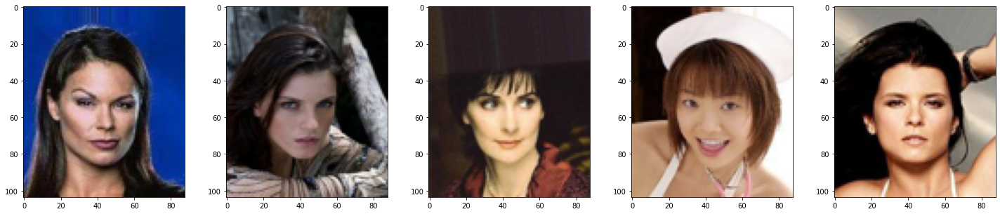

  ---------------===[[ DATASET HOLDER SETTINGS/STATE ]]===---------------

  --------------------dataset info
  typemode: to_fetch
  name: celeba
  folder_path: ../input/dc-gan-data-prep-3
  dataset_size: 202624

  --------------------preprocess and sampling info
   preprocess turned on: True
   preprocess settings: {'colormode': 'unk', 'resize': 'unk', 'normalize': 'unk'}
   inline (during iteration) normalization: True
   sampling settings: batch size 128 , shuffle True

  --------------------memory management info
   memory management mode: SL_prep
   FETCH state: True
   SL_folder_path:  ../input/dc-gan-data-prep-3
   SL_format:  batch
   SL_prep_prefix:  prep_[_res:{_mlt:0.5_nmf:8_}_]_[_shf:Tr_Bsize:128_]_
   SL_batch_prefix:  celeba_prep_[_res:{_mlt:0.5_nmf:8_}_]_[_shf:Tr_Bsize:128_]_

  --------------------images info
  scanned folder: False  ( scan mode is no)
  unprocessed images height   (N rows) : unk
  unprocessed images width  (N columns): unk
  unprocessed images channels

In [27]:
# DH.show_first_img(prep=False)
DH.show_first_img()

prep_img_shapes=DH.get_prep_shapes(verbose=0)
if IMG_SHAPE=='infer':
    IMG_SHAPE=prep_img_shapes
train_dataset=DH
DH.display_state()

In [28]:
IMG_SHAPE

(104, 88, 3)

In [29]:
print("   evaluating iteration time:\n")
st=time.time()
for n, _ in enumerate(train_dataset):
    if n%150==0:
        print("    batch",n,"; time:", (time.time()-st)/60, end='')
    if not isinstance(train_dataset, Dataset_Holder ):
        print("\r")
end=time.time()
print(" iterating over dataset takes around {:.2f} minutes".format((end-st)/60) )

   evaluating iteration time:

       1583 preprocessed batches loaded  [====================]  100.00 %  completed

 iterating over dataset takes around 1.17 minutes


# Inizializzazione dei modelli

Qui i modelli vengono caricati o inizializzati con i comandi dati dalle routine sopra definite

In [30]:
if USE_MANUAL_COMMANDS:
    GENERATOR_COMMANDS=MANUAL_GENERATOR_COMMANDS
    DISCRIMINATOR_COMMANDS=MANUAL_DISCRIMINATOR_COMMANDS

        
else:
    if GEN_ROUTINE['OUT_SHAPE']=='infer':
        GEN_ROUTINE['OUT_SHAPE']=IMG_SHAPE
    if DIS_ROUTINE['IN_SHAPE']=='infer':
        DIS_ROUTINE['IN_SHAPE']=GEN_ROUTINE['OUT_SHAPE']
        
    GENERATOR_COMMANDS=get_std_generator_commands(
        GEN_ROUTINE['IN_SHAPE'], GEN_ROUTINE['OUT_SHAPE'],
        N_conv_layers=GEN_ROUTINE['N_CONV_LAYERS'], first_tensor_thickness=GEN_ROUTINE['FIRST_TENSOR_THICKNESS'],
        out_channels=GEN_ROUTINE['OUT_CHANNELS'],strides=GEN_ROUTINE['STRIDES'],filter_shapes=GEN_ROUTINE['FILTER_SHAPES'],padding=GEN_ROUTINE['PADDING'],
        batchnorm=GEN_ROUTINE['BATCHNORM'], activation=GEN_ROUTINE['ACTIVATION'],
        modeltype='custom', verb_warning='strict'
    )
    
    DISCRIMINATOR_COMMANDS=get_std_discriminator_commands(
        DIS_ROUTINE['IN_SHAPE'], out_shape=DIS_ROUTINE['OUT_SHAPE'], 
        N_conv_layers=DIS_ROUTINE['N_CONV_LAYERS'],
        N_filters=DIS_ROUTINE['N_FILTERS'], strides=DIS_ROUTINE['STRIDES'], filter_shapes=DIS_ROUTINE['FILTER_SHAPES'], padding=DIS_ROUTINE['PADDING'],
        batchnorm=DIS_ROUTINE['BATCHNORM'], activation=DIS_ROUTINE['ACTIVATION'], dropout_value=DIS_ROUTINE['DROPOUT'],
        last_lay_activation=DIS_ROUTINE['LAST_LAY_ACT'],
        modeltype='custom', verb_warning='strict'
    )
    
if GENERATOR_CUST_NAME=='infer':
    GENERATOR_CUST_NAME=train_dataset.dataset_name.upper()
if DISCRIMINATOR_CUST_NAME=='infer':
    DISCRIMINATOR_CUST_NAME=GENERATOR_CUST_NAME+'_'

WARNING provided list of strides of lenght 3  while expected N_conv_layers is 4
        filling latest layers with latest value provided: (2, 2)
WARNING provided list of filter_shapes of lenght 2  while expected N_conv_layers is 4
        filling latest layers with latest value provided: (5, 5)
WARNING provided list of out_channels of lenght 1  while expected N_conv_layers is 4
        filling latest layers with recursive half of: 256
3 --------------------
WARNING provided list of filter_shapes of lenght 1  while expected N_conv_layers is 2
        filling latest layers with latest value provided: (5, 5)
WARNING provided list of N_filters of lenght 1  while expected N_conv_layers is 2
        filling latest layers with recursive duble of: 64


In [31]:


print("#"*25+" BUILDING GENERATOR MODEL "+"#"*25)
GENERATOR=Generator(GENERATOR_MODE, pathname=GENERATOR_LOAD_PATHNAME,
                    commands=GENERATOR_COMMANDS, cust_name=GENERATOR_CUST_NAME, #se mode è 'load' ignora questo parametri, altrimenti ignora pathname
                    noise_size=NOISE_SIZE, img_shape=IMG_SHAPE) #questi tuttalpiù per assertion


print()
print()


print("#"*23+" BUILDING DISCRIMINATOR MODEL "+"#"*23)
DISCRIMINATOR=Discriminator(DISCRIMINATOR_MODE, pathname=DISCRIMINATOR_LOAD_PATHNAME, 
                            commands=DISCRIMINATOR_COMMANDS, cust_name=DISCRIMINATOR_CUST_NAME, #se mode è 'load' ignora questi parametri, altrimenti ignora pathname
                            input_shape=IMG_SHAPE, weight_loss_on_generated=DISCRIMINATOR_WEIGHT_LOSS_ON_GENERATED) #questi tuttalpiù per assertion

######################### BUILDING GENERATOR MODEL #########################
----> loading model from  	 ../input/train-results/results (3)/CELEBA_Generator_noisesize_250imgshape_(104 88 3)sizemodel_16_50.h5
----> loading state from  	 ../input/train-results/results (3)/CELEBA_Generator_noisesize_250imgshape_(104 88 3)sizemodel_16_50.npy


####################### BUILDING DISCRIMINATOR MODEL #######################
----> loading model from  	 ../input/train-results/results (3)/CELEBA__Discriminator_imgshape_(104 88 3)sizemodel_10_50.h5
----> loading state from  	 ../input/train-results/results (3)/CELEBA__Discriminator_imgshape_(104 88 3)sizemodel_10_50.npy


In [32]:
GENERATOR.summary(verbose=2)
print()
print()
DISCRIMINATOR.summary(verbose=2)




#################### GENERATOR STATE INFO ####################


    cust_name : CELEBA
    noise_size : 250
    img_shape : (104, 88, 3)
    epochs_trained : 50


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 36608)             9152000   
_________________________________________________________________
batch_normalization (BatchNo (None, 36608)             146432    
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 36608)             0         
_________________________________________________________________
reshape (Reshape)            (None, 13, 11, 256)       0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 13, 11, 256)       3211264   
_________________________________________________________________
batch_normalization_1

In [33]:
from pprint import pprint

In [34]:
if LOAD_MODELS:
    pprint(GENERATOR.generator_commands)

ListWrapper([DictWrapper({'input': 250}), DictWrapper({'dense': DictWrapper({'out_shape': 36608, 'use_bias': False})}), {'batchnormalization'}, DictWrapper({'activation': 'leakyrelu'}), DictWrapper({'reshape': (13, 11, 256)}), DictWrapper({'conv2dtr': DictWrapper({'out_channels': 256, 'strides': (1, 1), 'filters_shape': (7, 7), 'padding': 'same'})}), {'batchnormalization'}, DictWrapper({'activation': 'leakyrelu'}), DictWrapper({'conv2dtr': DictWrapper({'out_channels': 128.0, 'strides': (2, 2), 'filters_shape': (5, 5), 'padding': 'same'})}), {'batchnormalization'}, DictWrapper({'activation': 'leakyrelu'}), DictWrapper({'conv2dtr': DictWrapper({'out_channels': 64.0, 'strides': (2, 2), 'filters_shape': (5, 5), 'padding': 'same'})}), {'batchnormalization'}, DictWrapper({'activation': 'leakyrelu'}), DictWrapper({'conv2dtr': DictWrapper({'out_channels': 3, 'strides': (2, 2), 'filters_shape': (5, 5), 'padding': 'same'})}), DictWrapper({'activation': 'tanh'})])


(saving is/as ./CELEBA_3050_1.png )


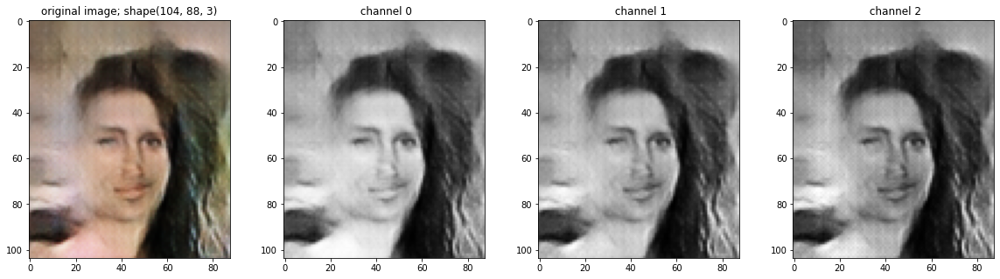

 discriminator prediction: tf.Tensor([[0.05826938]], shape=(1, 1), dtype=float32)


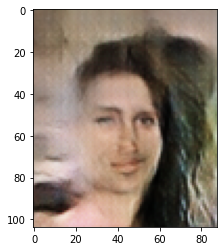

<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[0.05826938]], dtype=float32)>

In [35]:
img=GENERATOR.make_out(verb=True, channels='all')
# for i in range(10):
#     print(img[0,i,i,:])
# for i in range(3):
#     print(img[0,:,:,i].max())
#     print(img[0,:,:,i].min())
# img2=np.array([img[0,:,:,0]-120, img[0,:,:,1],img[0,:,:,2]]).T

# plt.imshow(img2)
# plt.show()

DISCRIMINATOR.predict(img, verb=True)

In [36]:
if TEST_RUN:
    if GENERATOR_SAVE:
        GENERATOR.save(name_mode=GENERATOR_SAVE_NAMEMODE, path=GENERATOR_SAVE_PATH)
    if DISCRIMINATOR_SAVE:
        DISCRIMINATOR.save(name_mode=DISCRIMINATOR_SAVE_NAMEMODE, path=DISCRIMINATOR_SAVE_PATH)


In [37]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
# checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
#                                  discriminator_optimizer=discriminator_optimizer,
#                                  generator=generator,
#                                  discriminator=discriminator)
checkpoint=tf.train.Checkpoint(generator=GENERATOR,
                               discriminator=DISCRIMINATOR)

In [38]:
def generate_and_save_images(model, epoch, input_seed):
    predictions = model(input_seed, training=False).numpy()
    width_plot=25
    height_plot=np.ceil(5* np.ceil(len(input_seed)/5) ).astype(int)
    fig = plt.figure(figsize=(width_plot, height_plot))
    for i in range(predictions.shape[0]):
        plt.subplot(np.ceil(height_plot/5).astype(int), 5, i+1)
        plt.imshow((predictions[i] * 127.5 + 127.5).astype(int), cmap='gray')
        plt.axis('off')
    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

# Training

Qui vengono definite e successivamente eseguite le funzioni di training, osservando man mano l'andamento di loss e metriche, distinte in metriche del generatore e discriminatore. Le metriche del discriminatore sono a sua volta distinte in metriche sulle immmagini reali, immagini generate e metriche complessive. Questa distinzione mi ha permesso un po' meglio di capire il funzionamento del training delle GAN, ed in particolare l'accuratezza binaria mi ha dato un'idea di quanto il generatore riuscisse a "convincere" il discriminatore.

Idealmente il comportamento da ottenere è quello in cui le curve di loss e metriche tendono ad un asintoto orizzontale, con la loss del generatore più bassa del discriminatore (che sta a significare che le immagini generate sono "convincenti"). Questo tipo di curva è stato il mio riferimento per valutare -oltre all'osservazione delle immagini- la validità del rapporto tra i due modelli GAN.

Il risultato che ho ottenuto dà l'avvicinamento ad un asintoto orizzontale per queste curve, ma la loss del generatore significativamente maggiore di quella del discriminatore. Questo significa che il discriminatore riusciva a distinguere bene le immagini reali da quelle generate, ma dalla accuratezza binaria si può vedere come circa il 15-20 % delle volte il generatore risultasse abbastanza convincente.

E' curioso inoltre osservare come per discriminare meglio immagini reali e generate, il discriminatore debba perdere accuratezza nelle immagini reali (classificasse tutte le immagini come reali, la sua accuratezza binaria sarebbe il 100% su quelle reali ma lo 0% su quelle generate, e la sua loss molto alta).

Come aggiunta ulteriore sarebbe interessante vedere cosa osservi il discriminatore per scegliere la realisticità di un'immagine, poiché talvolta considera molto poco reali dei volti in realtà mediamente credibili e talvolta viceversa. In questo ho pensato possa classificare in base allo sfondo, poiché purtroppo il dataset CELEBA -non essendo propriamente pensato per le GAN- ha immagini con sfondi variabili; sebbene infatti il generatore si sia dimostrato in grado di riprodurre le caratteristiche di un volto, è al contrario molto "nebuloso" nella generazione degli sfondi.

Per questo un'aggiunta molto utile al programma sarebbe quella di poter vedere quali zone dell'immagine risultano più importanti per il discriminatore nella scelta della classe delle immagini





In [39]:
tf.config.experimental_run_functions_eagerly(True) 

In [40]:
if BATCH_SIZE=='infer':
    BATCH_SIZE=train_dataset.batch_size
    
BINARY_TRASHOLD=0.5

In [41]:

# Notice the use of `tf.function`
# This annotation causes the function to be "compiled".
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, NOISE_SIZE])
    
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:     #a ogni giro:
        generated_images = GENERATOR.model(noise, training=True)                        #il generatore genera immagini
        
        real_outputs = DISCRIMINATOR.model(images, training=True)                        #il discriminatore prende immagini reali e le classifica
        fake_outputs = DISCRIMINATOR.model(generated_images, training=True)              #il discriminatore prende le immagini generate  e le classifica
        dis_loss = DISCRIMINATOR.loss(real_outputs,fake_outputs)
        gen_loss = GENERATOR.loss(fake_outputs) #^^^^^------queste quattro sono quelle usate per il training, il resto è visualizzazione       
        
        gradients_of_generator = gen_tape.gradient(gen_loss, GENERATOR.model.trainable_variables)
        gradients_of_discriminator = disc_tape.gradient(dis_loss, DISCRIMINATOR.model.trainable_variables)
        
        GENERATOR.optimizer.apply_gradients(zip(gradients_of_generator, GENERATOR.model.trainable_variables))
        DISCRIMINATOR.optimizer.apply_gradients(zip(gradients_of_discriminator, DISCRIMINATOR.model.trainable_variables))
        
#         print( real_outputs.numpy())
#         print( fake_outputs.numpy()) debugging
#         print( dis_losses.numpy())
#         print( gen_losses.numpy())
#         print( dis_losses_on_real.numpy())
#         print( dis_losses_on_gen.numpy())
        
# ---------------------------------------------------------------------------metrics

# --------------------crossentropy        
    dis_loss_on_real=DISCRIMINATOR.loss_on_real(real_outputs).numpy() 
    dis_loss_on_gen =DISCRIMINATOR.loss_on_gen (fake_outputs).numpy()
    dis_loss_on_all=dis_loss.numpy()
    gen_loss_on_all=gen_loss.numpy()

# --------------------mae        
    dis_auc_on_real=np.abs(real_outputs.numpy()-1).mean()
    dis_auc_on_gen =np.abs(fake_outputs.numpy()-0).mean()
    dis_auc_on_all =(dis_auc_on_real+dis_auc_on_gen)/2
    gen_auc_on_all =np.abs(fake_outputs.numpy()-1).mean()

# -------------------- binary accuracy    
    dis_binacc_on_real=(real_outputs.numpy()>=BINARY_TRASHOLD).mean() 
    dis_binacc_on_gen =(fake_outputs.numpy()< BINARY_TRASHOLD).mean()
    dis_binacc_on_all =(dis_binacc_on_real+dis_binacc_on_gen)/2
    gen_binacc_on_all =1-dis_binacc_on_gen     
    
    return ( 
        {
        'crossentropy':{'dis':{'on_real': dis_loss_on_real ,'on_gen': dis_loss_on_gen, 'all': dis_loss_on_all }, 'gen':{'all':gen_loss_on_all} } ,
        'mae': {'dis':{'on_real': dis_auc_on_real ,'on_gen': dis_auc_on_gen, 'all': dis_auc_on_all }, 'gen':{'all':gen_auc_on_all} },
        'binacc': {'dis':{'on_real': dis_binacc_on_real ,'on_gen': dis_binacc_on_gen, 'all': dis_binacc_on_all }, 'gen':{'all':gen_binacc_on_all} }
           },
        {'predictions_on_real': list( real_outputs.numpy().flatten() ), 'predictions_on_gen': list( fake_outputs.numpy().flatten() )}
    )
        

In [42]:
from pprint import pprint 

In [43]:
TOT_TRAINED_EPOCHS=0
EPOCH_VIS_MEAN=True
METRICS={}

def TRAIN(dataset, epochs, N_step_epoch_save=CHECKPOINT_STEPS):
    
    if TEST_RUN:
        print("\nWARNING this is a test run\n")
    
    global TOT_TRAINED_EPOCHS
    start_all=time.time()
    global METRICS
    
    for epoch in range(epochs):
        if epoch==1 and TEST_RUN: break 
        TOT_TRAINED_EPOCHS+=1
        GENERATOR.step_epochs()
        DISCRIMINATOR.step_epochs()
        start_partial = time.time()
        
        epoch_metrics={}
        epoch_predictions={'on_real':[], 'on_gen':[]}
        for n, image_batch in enumerate(train_dataset):
            if n==3 and TEST_RUN: break
                
            (batch_metric, batch_predictions)= train_step(image_batch)
            for metric in batch_metric:
                for model in batch_metric[metric]:
                    for data_subset in batch_metric[metric][model]:
                        if metric not in epoch_metrics:
                            epoch_metrics[metric]={}
                        if model not in epoch_metrics[metric]:
                            epoch_metrics[metric][model]={}
                        if data_subset not in epoch_metrics[metric][model]:
                            epoch_metrics[metric][model][data_subset]=[]
                        epoch_metrics[metric][model][data_subset].append(batch_metric[metric][model][data_subset])
                        
            epoch_predictions['on_real']+=batch_predictions['predictions_on_real']
            epoch_predictions['on_gen']+=batch_predictions['predictions_on_gen']        #to be tested
                        
        for metric in epoch_metrics:
            for model in epoch_metrics[metric]:
                for data_subset in epoch_metrics[metric][model]:
                    if metric not in METRICS:
                        METRICS[metric]={}
                    if model not in METRICS[metric]:
                        METRICS[metric][model]={}
                    if data_subset not in METRICS[metric][model]:
                        METRICS[metric][model][data_subset]=[]
                    
                    if EPOCH_VIS_MEAN:
                        METRICS[metric][model][data_subset].append( np.array(epoch_metrics[metric][model][data_subset]).mean() )
                    else:
                        METRICS[metric][model][data_subset]+=epoch_metrics[metric][model][data_subset]

        display.clear_output(wait=True)
        generate_and_save_images(GENERATOR.model,
                                 TOT_TRAINED_EPOCHS,
                                 seed) #NB QUESTA NON SALVA NELLA CARTELLA DI OUTPUT (non ha path)
        
        print("           PLOTS LEGEND: for all metrics: Discriminator[ on real(c-), on generated(m-) on all(b) ] vs Generator(r)]")
        fig = plt.figure( figsize=(20,7) )
        for k, metric in enumerate(METRICS):
            plt.subplot(1,3,k+1)
            plt.grid()
            plt.title("metric: "+metric) 
            for model in METRICS[metric]:
                for data_subset in METRICS[metric][model]:
                    if data_subset=='on_real': 
                        color='c'
                        line='--'
                    if data_subset=='on_gen':  
                        color='m' 
                        line='--'
                    if data_subset=='all':
                        if model=='dis': 
                            color='b'
                            line='-'
                        if model=='gen': 
                            color='r'
                            line='-'
                    
                    plt.plot(METRICS[metric][model][data_subset], color=color, linestyle=line)
        plt.show()
        
        
# istogramma con le predizioni
#         fig = plt.figure( figsize=(20,7) )
#         plt.subplot(1,2,1)
        plt.hist(epoch_predictions['on_real'], bins=25, histtype='stepfilled', alpha=0.3, color='c')
        plt.hist(epoch_predictions['on_gen'] , bins=25, histtype='stepfilled', alpha=0.3, color='m')
        plt.title("Discriminator predictions on real (C) and on generated (M) images")
        plt.grid()
        plt.show()

        if (TOT_TRAINED_EPOCHS) % N_step_epoch_save == 0:
#           checkpoint.save(file_prefix = checkpoint_prefix)
            if GENERATOR_SAVE:
                GENERATOR.save(name_mode=GENERATOR_SAVE_NAMEMODE, path=GENERATOR_SAVE_PATH)
            if DISCRIMINATOR_SAVE:
                DISCRIMINATOR.save(name_mode=DISCRIMINATOR_SAVE_NAMEMODE, path=DISCRIMINATOR_SAVE_PATH)
    
        print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start_partial))
        print(" current training time of {:.2f} minutes".format( (time.time()-start_all)/60 ) )
        print(" Extimated remaining time (based on last epoch): {:.2f} minutes".format( (time.time()-start_partial)*(epochs-epoch-1)/60) )

    print("  TRAINING DONE ")
    return METRICS

In [44]:
# EPOCHS=5
if not LOAD_MODELS:
    print("  training for", EPOCHS)


In [45]:
if not LOAD_MODELS:
   TRAIN(train_dataset, EPOCHS)
else:
    print("load models:", LOAD_MODELS,", no training will be done")
print()

load models: True , no training will be done



In [46]:
if not LOAD_MODELS:
    if GENERATOR_SAVE:
        GENERATOR.save(name_mode=GENERATOR_SAVE_NAMEMODE, path=GENERATOR_SAVE_PATH)
    if DISCRIMINATOR_SAVE:
        DISCRIMINATOR.save(name_mode=DISCRIMINATOR_SAVE_NAMEMODE, path=DISCRIMINATOR_SAVE_PATH)


In [47]:
GENERATOR.summary()
print("\n\n")
DISCRIMINATOR.summary()




#################### GENERATOR STATE INFO ####################


    cust_name : CELEBA
    noise_size : 250
    img_shape : (104, 88, 3)
    epochs_trained : 50


Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 36608)             9152000   
_________________________________________________________________
batch_normalization (BatchNo (None, 36608)             146432    
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 36608)             0         
_________________________________________________________________
reshape (Reshape)            (None, 13, 11, 256)       0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 13, 11, 256)       3211264   
_________________________________________________________________
batch_normalization_1

In [48]:
anim_file = 'celeba_dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('../input/train-results/results (3)/image*.png')
  filenames = sorted(filenames)
  for filename in filenames:
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)
    

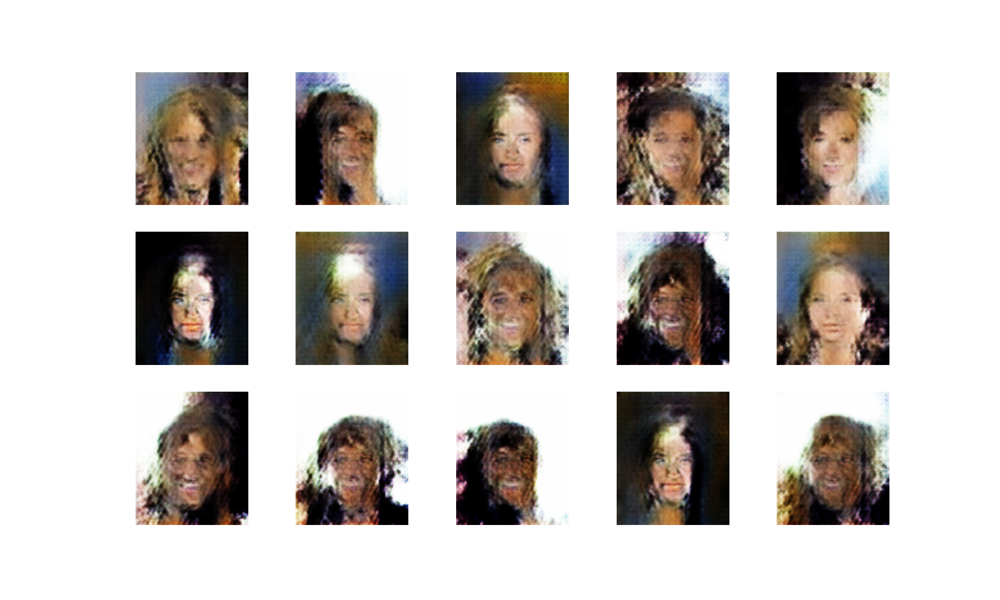

In [49]:
def display_image(path, epoch_no):
  return PIL.Image.open(path+'/image_at_epoch_{:04d}.png'.format(epoch_no))

imgs_path=IMG_LOAD_PATH
if not LOAD_MODELS:
    imgs_path="./"
display_image(imgs_path,10)

In [50]:
import tensorflow_docs.vis.embed as embed
# embed.embed_file(anim_file)

# Immagini generate

Di seguito ho "giocato" un po' con il generatore ed osservato il suo comportamento. Si può a mio avviso vedere come sia effettivamente in grado di generare occhi, naso bocca e bordi dei volti, ma nessuna immagine si possa dire "realistica" (quanto più un dipinto). In questo ha sicuramente giocato un ruolo il fatto di lavorare con immagini a bassa risoluzione, ma in parte dev'essere dovuto anche alla -forse- troppo piccola dimensione del noise in input (che quindi riduce la dimensionalità dello spazio latente da individuare) e/o dell'architettura forse troppo semplice.

In particolare ho notato come tutte le immagini abbiano "una griglia di rumore", fatto che non ho ben saputo interpretare ma ho pensato possa essere dovuto a troppi pochi layer -o male calibrati- che evidentemente non riescono bene ad apprendere caratteristiche più granulari dei dettagli dell'immagini. Quindi forse qualche carenza negli ultimi layer di conv2d-trasposta (quelli che si occupano di generare gli ultimi dettagli dell'immagini) che evidentemente non riescono ad apprendere filtri abbastanza diversi tra loro. Questo è legato anche al fatto che la nitidezza delle immagini è sempre scarsa, segno che quindi (penso) i filtri nei layer convoluzionali non apprendono forme "nette" ma "sfocate". 

Un'aggiunta utile in questo senso sarebbe visualizzare nello specifico i filtri del generatore, e modificare l'architettura da considerazioni al riguardo.

Le funzioni del generatore ci permettono in ogni caso di generare volti che per il discriminatore sono credibili, e sebbene il discriminatore stesso non è scontato consideri credibile qualcosa con gli stessi criteri umani, ci dà immagini mediamente più realistiche delle altre

(saving is/as ./CELEBA_3050_2.png )


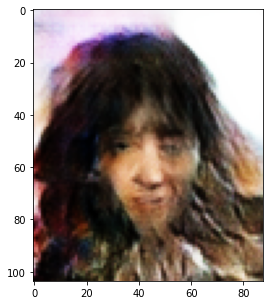

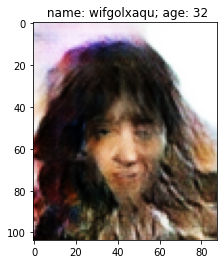

tf.Tensor([[0.00252685]], shape=(1, 1), dtype=float32)



In [51]:
syll=['au', 'wif','gol','tu','af', 'go','ku','-m','ty','ws','ha', 'aws', 'ky', 'rs', 'vc','xa','bas','rus','kug','qu']
name="".join(rnd.sample( syll, 4 ))
age=np.random.randint(low=8, high=64)
fig = plt.figure(figsize=(10, 5))
face=GENERATOR.make_out( verb=True)# channels='all' )
plt.imshow(face[0], cmap='gray')
plt.title(" name: "+name+"; age: "+str(age) )
plt.show()
prediction=DISCRIMINATOR.predict(face)
print(prediction)
print()
# print(age)

    after 107 iteration, generated img with prediction of 0.5411858
(saving is/as ./CELEBA_3050_3.png )


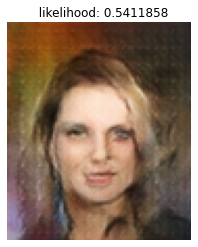

In [52]:
L_seed_1, L_img_1, _ = GENERATOR.GOL(DISCRIMINATOR, trs=0.5, verb=2)

 400  images generated


   most likely image in sample of 500
(saving is/as ./CELEBA_3050_4.png )


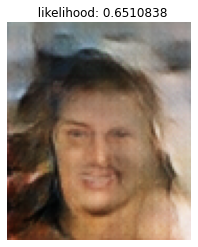

In [53]:
L_seed_2, L_img_2, _ = GENERATOR.most_likely_on_set(DISCRIMINATOR)

# Esplorazione dello spazio latente

Per sua natura il generatore individua quindi uno spazio, da cui -in breve- estrae immagini random. Muovendoci in questo spazio possiamo farci un'idea di cosa il generatore consideri "una faccia". 

Muovendoci randomicamente intorno ad un noise input, si nota come le immagini tendano a deformarsi. Se questo spostamento random non è ben calibrato i volti perdono velocemente le loro fattezze, segno che in effetti il generatore è calibrato per avere in input un noise gaussiano normalizzato (come appunto quello dato in training)

Interpolando tra due volti e passando per lo spazio latente, si nota invece come il generatore "deformi le immagini da una all'altra" ma cercando di mantenere sempre qualcosa di "visivamente simile ad un volto".


In [54]:
# GENERATOR.explore_near_seed(seed=L_seed_1, near_factor=2)

(saving is/as ./CELEBA_3050_5.png )


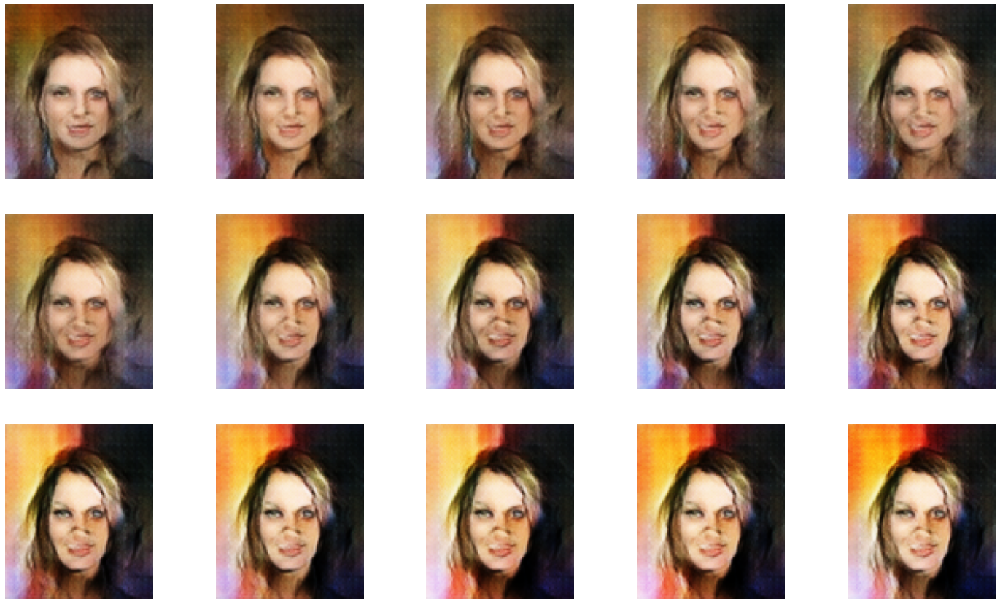

In [55]:
GENERATOR.explore_near_seed(seed=L_seed_1, near_factor=5)

(saving is/as ./CELEBA_3050_6.png )


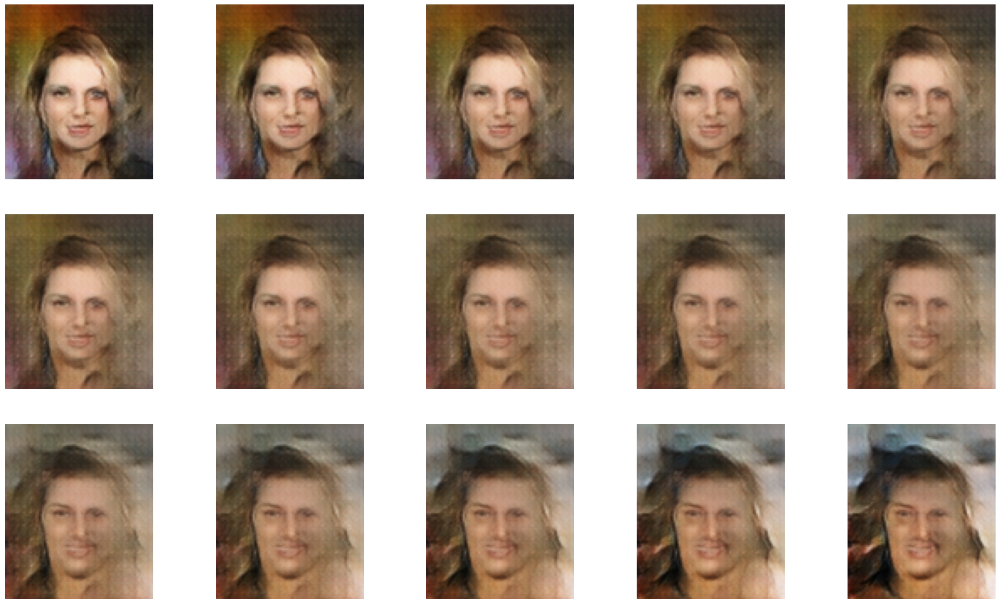

In [56]:
GENERATOR.interpolate_between_seeds( seed1=L_seed_1, seed2=np.array([L_seed_2]) )

# Valutazione oggettiva dei risultati

Ragionare sullo spazio latente offre inoltre possibilità di valutare oggettivamente la qualità dei risultati: alcuni metodi per valutare una GAN si basano infatti sul confronto delle proprietà topologiche tra lo spazio latente e lo spazio delle immagini realistiche su cui si è eserctata la GAN. Sapendo questo ho implementato una funzione "molto grezza" per confrontare questi due spazi: calcolare e confrontare la media delle immagini generate e delle immagini reali. Come si può vedere queste immagini risultano "relativamente simili", ed in effetti emerge qui più chiaramente quel rumore "a griglia" di cùi sopra.

Visualizzando la differenza tra immagini (qui mostrate con un filtro che enfatizza i pixel) e quantificandone la differenza con distanza euclidea, si conclude che il centro dello spazio latente è in realtà piuttosto vicino -in senso euclideo- al centro delle immagini reali. Questa metrica quindi, per quanto semplice, mi ha fatto pensare che lo spazio latente individuato sia in realtà piuttosto vicino allo spazio "target", ma poiché è evidente che le immagini non siano realistiche ad occhio umano deve differire fortemente in conformazione. 

Un'interessante aggiunta potrebbe essere quindi usare lo stesso criterio per approfondire lo studio topologico degli spazi latenti generati -o tuttalpiù usare altri tipi di metriche- e poi usare queste "valutazioni oggettive" per ragionare su come migliorare la generazione.

     900 imgs generated

 
   avg img in sample of 1000
(saving is/as ./CELEBA_3050_7.png )


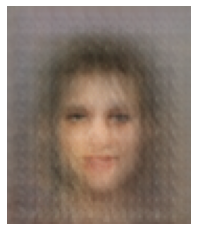

In [57]:
gen_avg_img=GENERATOR.compute_avg_img(sample_size=1000)
print()

          9 preprocessed batches loaded  [>-------------------]  0.57 %  completed


   avg img in sample of 1000


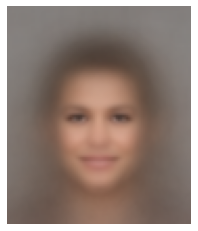

In [58]:
real_avg_img=train_dataset.compute_avg_img(sample_size=1000)
print()

In [59]:
def geomavg_evaluate_gen(generator=None, dataset=None, sample_size=1000, R_avimg=None, G_avimg=None, mask=None, cmap=None):
    if sample_size=='all':
        sample_size=dataset.dataset_size
    
    if R_avimg is None:
        R_avimg=dataset.compute_avg_img(sample_size=sample_size)
    if G_avimg is None:
        G_avimg=generator.compute_avg_img(sample_size=sample_size)
        
    plt.figure( figsize=(20,7) )   
    plt.subplot(1,3,1)    
    R_m_G=R_avimg-G_avimg
    unmasked_R_m_G=deepcopy(R_m_G)
    if type(mask) is dict:
        if 'add' in mask:
            R_m_G+=mask['add']
        if 'mult' in mask:
            R_m_G*=mask['mult']
    plt.title("Real_avg_img - Generated_avg_img")
    plt.imshow(R_m_G, cmap=cmap)
    plt.axis('off')
    
    plt.subplot(1,3,2) 
    G_m_R=G_avimg-R_avimg
    unmasked_G_m_R=deepcopy(G_m_R)    
    if type(mask) is dict:
        if 'add' in mask:
            G_m_R+=mask['add']
        if 'mult' in mask:
            G_m_R*=mask['mult']
    plt.title("Generated_avg_img-Real_avg_img")
    plt.imshow(G_m_R, cmap=cmap)
    plt.axis('off')

    plt.subplot(1,3,3) 
    abs_diff=np.abs(R_m_G)
    unmasked_abs_diff=deepcopy(abs_diff)    
    if type(mask) is dict:
        if 'add' in mask:
            abs_diff+=mask['add']
        if 'mult' in mask:
            abs_diff*=mask['mult']
    plt.title("absolute difference")
    plt.imshow(abs_diff, cmap=cmap)
    plt.axis('off')
    
    if mask is not None:
        print("            image mask active:", mask)
    plt.show()
    
    distance=np.linalg.norm(R_avimg-G_avimg)
    print("\n\n    Euclidean distance between these two avg imgs: ", distance)
    
    N_pixels=1
    for shp in R_avimg.shape:
        N_pixels*=shp
    avg_pixelwise_distance=distance=distance/N_pixels
    print("\n\n    Average pixelwise euclidean distance: ", avg_pixelwise_distance)

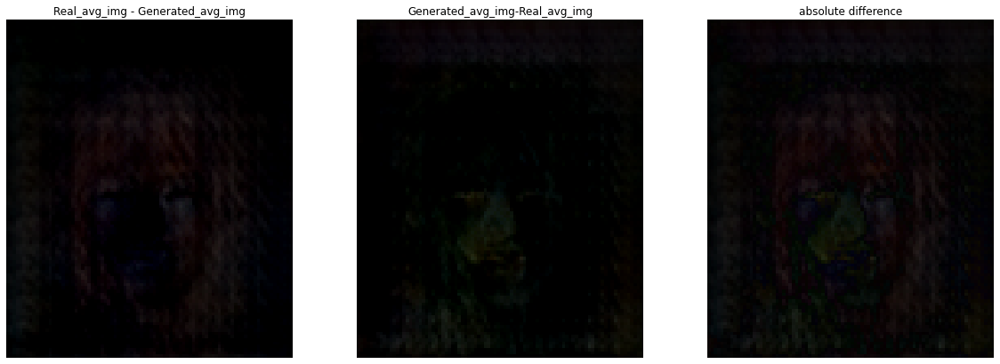



    Euclidean distance between these two avg imgs:  1611.8073706246662


    Average pixelwise euclidean distance:  0.058705105282075544


In [60]:
geomavg_evaluate_gen(R_avimg=real_avg_img, G_avimg=gen_avg_img)

            image mask active: {'mult': 3}


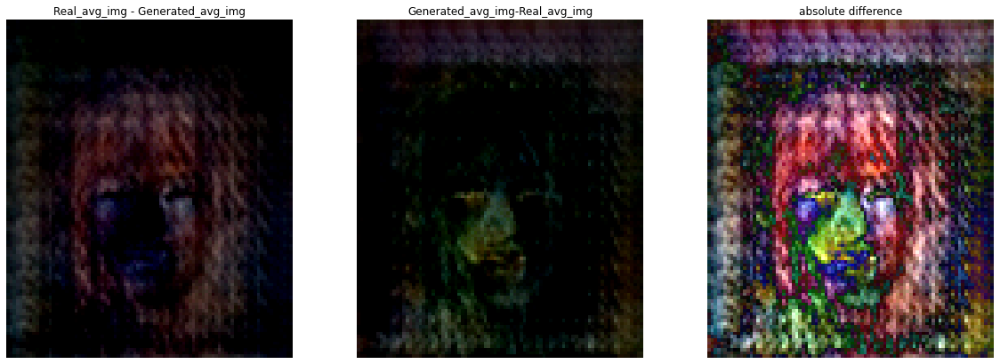



    Euclidean distance between these two avg imgs:  1611.8073706246662


    Average pixelwise euclidean distance:  0.058705105282075544


In [61]:
geomavg_evaluate_gen(R_avimg=real_avg_img, G_avimg=gen_avg_img, mask={'mult':3})

          9 preprocessed batches loaded  [>-------------------]  0.57 %  completed


   avg img in sample of 1000


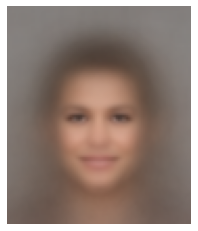

     900 imgs generated

 
   avg img in sample of 1000
(saving is/as ./CELEBA_3050_8.png )


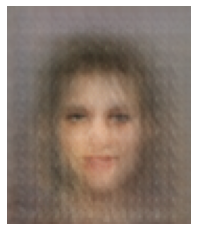

            image mask active: {'mult': 3}


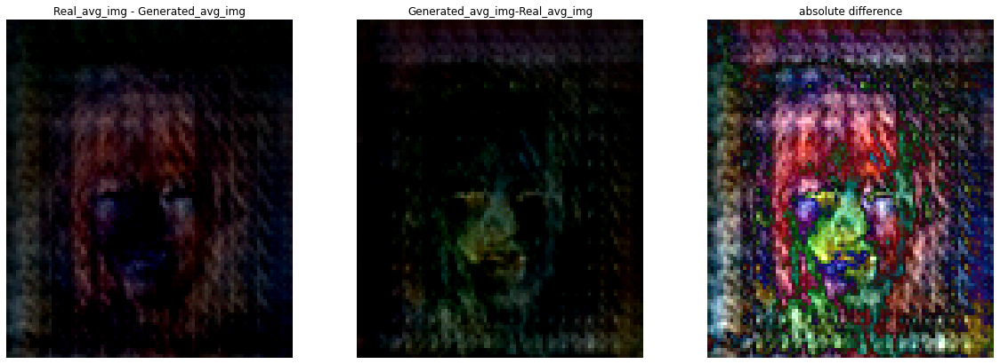



    Euclidean distance between these two avg imgs:  1461.839936518359


    Average pixelwise euclidean distance:  0.05324300468088429


In [62]:
geomavg_evaluate_gen(generator=GENERATOR, dataset=train_dataset, sample_size=1000, mask={'mult':3})

 Generating new collection


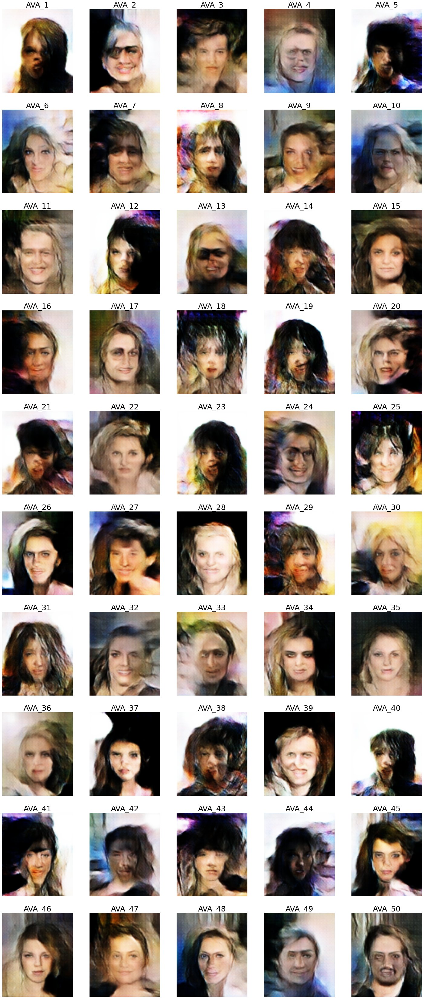

In [63]:
GENERATOR.make_collection()